# Breast Cancer

##### **Disclaimer**: el análisis del conjunto de datos de cáncer de mama es exclusivamente con fines educativos y de investigación. Los resultados y conclusiones presentados aquí no deben considerarse como asesoramiento médico, diagnóstico o recomendaciones para tratamiento. Este análisis no ha sido revisado ni aprobado por profesionales médicos.

In [3]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from feature_engine.imputation import CategoricalImputer
from feature_engine.selection import DropFeatures
from feature_engine.encoding import RareLabelEncoder
from feature_engine.discretisation import ArbitraryDiscretiser
from sklearn.preprocessing import OneHotEncoder,FunctionTransformer, MinMaxScaler
from feature_engine.transformation import BoxCoxTransformer
from sklearn.linear_model import BayesianRidge
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

In [4]:
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator, TransformerMixin
from feature_engine.transformation import YeoJohnsonTransformer

In [5]:
import scipy.stats as stats
from feature_engine.outliers import Winsorizer

In [6]:
import matplotlib.pyplot as plt
import seaborn as sns

In [7]:
from phik import phik_matrix
import math

In [8]:
from sklearn import datasets

In [9]:
import lightgbm as lgb
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score, RandomizedSearchCV, KFold, StratifiedKFold, cross_validate
import optuna
from optuna.pruners import HyperbandPruner
from sklearn.metrics import roc_curve, roc_auc_score, confusion_matrix, classification_report
from sklearn.metrics import precision_recall_curve, roc_curve, accuracy_score, confusion_matrix, roc_curve, auc, f1_score
from sklearn.metrics import roc_curve, roc_auc_score, confusion_matrix, classification_report
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, average_precision_score

## Cargo los datos

In [11]:
raw_data = datasets.load_breast_cancer()
raw_data.keys()

dict_keys(['data', 'target', 'frame', 'target_names', 'DESCR', 'feature_names', 'filename', 'data_module'])

In [12]:
print(raw_data["DESCR"])

.. _breast_cancer_dataset:

Breast cancer wisconsin (diagnostic) dataset
--------------------------------------------

**Data Set Characteristics:**

:Number of Instances: 569

:Number of Attributes: 30 numeric, predictive attributes and the class

:Attribute Information:
    - radius (mean of distances from center to points on the perimeter)
    - texture (standard deviation of gray-scale values)
    - perimeter
    - area
    - smoothness (local variation in radius lengths)
    - compactness (perimeter^2 / area - 1.0)
    - concavity (severity of concave portions of the contour)
    - concave points (number of concave portions of the contour)
    - symmetry
    - fractal dimension ("coastline approximation" - 1)

    The mean, standard error, and "worst" or largest (mean of the three
    worst/largest values) of these features were computed for each image,
    resulting in 30 features.  For instance, field 0 is Mean Radius, field
    10 is Radius SE, field 20 is Worst Radius.

    - 

1. Radio: Es la distancia desde el centro del tumor hasta su borde.
2. Textura: Mide la variabilidad en la intensidad de los píxeles en la imagen del tumor.
3. Perímetro: Es la longitud total del borde del tumor.
4. Área: Es el número de píxeles dentro del borde del tumor.
5. Suavidad: Mide la variabilidad en la intensidad de los píxeles en la superficie del tumor.
6. Compactación: Mide cuán compacta es la forma del tumor.
7. Concavidad: Mide la profundidad de los huecos en la forma del tumor.
8. Puntos Cóncavos: Son los puntos en el borde del tumor donde la forma se pliega hacia adentro.
9. Simetría: Mide cuán simétrico es el tumor en relación con su centro.
10. Dimensión Fractal: Mide la complejidad del borde del tumor.

Mean se refiere al promedio de los valores medidos para una característica específica

El standard error (se) o error estándar es una medida de la variabilidad de los valores de una característica. Indica cuán dispersos están los valores de esa característica alrededor del promedio.

Worst hace referencia al valor más alto o el peor caso para una característica entre todas las muestras del tumor.

- Radio, Perímetro, Área: Miden el tamaño físico del tumor. Los tumores malignos tienden a ser más grandes y con más variabilidad en estas medidas.
- Textura, Suavidad, Simetría: Miden la regularidad de la superficie del tumor. Los tumores malignos tienden a ser más irregulares y con bordes más rugosos.
- Compactación, Concavidad, Puntos Cóncavos: Miden la irregularidad en la forma del tumor. Los tumores malignos suelen tener formas más irregulares y bordes dentados o con huecos.
- Dimensión Fractal: Mide la complejidad del borde. Los tumores malignos suelen tener bordes más complejos.

In [16]:
columns=raw_data["feature_names"]
columns

array(['mean radius', 'mean texture', 'mean perimeter', 'mean area',
       'mean smoothness', 'mean compactness', 'mean concavity',
       'mean concave points', 'mean symmetry', 'mean fractal dimension',
       'radius error', 'texture error', 'perimeter error', 'area error',
       'smoothness error', 'compactness error', 'concavity error',
       'concave points error', 'symmetry error',
       'fractal dimension error', 'worst radius', 'worst texture',
       'worst perimeter', 'worst area', 'worst smoothness',
       'worst compactness', 'worst concavity', 'worst concave points',
       'worst symmetry', 'worst fractal dimension'], dtype='<U23')

## Análisis preliminar

### Analizo que los datos se hayan importado correctamente

In [19]:
df = pd.DataFrame(raw_data["data"],
                           columns=raw_data["feature_names"]
                          )

df["target"] = raw_data.target

In [20]:
df

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890,0
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902,0
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758,0
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300,0
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,...,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115,0
565,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,...,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637,0
566,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,...,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820,0
567,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,...,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400,0


Class Distribution: 212 - Malignant, 357 - Benign

In [22]:
df.shape

(569, 31)

### Intercambio los valores de la variable objetivo de forma tal que 1 sea maligno y 0 benigno

In [24]:
df.target.value_counts(True)

target
1    0.627417
0    0.372583
Name: proportion, dtype: float64

In [25]:
df['target'] = df['target'].replace({0: 1, 1: 0})

De esta manera queda que:
El target es una variable binaria donde:
0: Benigno
1: Maligno

In [27]:
df.target.value_counts(True)

target
0    0.627417
1    0.372583
Name: proportion, dtype: float64

### Verifico la forma en que se importaron los tipos de datos

In [29]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   mean radius              569 non-null    float64
 1   mean texture             569 non-null    float64
 2   mean perimeter           569 non-null    float64
 3   mean area                569 non-null    float64
 4   mean smoothness          569 non-null    float64
 5   mean compactness         569 non-null    float64
 6   mean concavity           569 non-null    float64
 7   mean concave points      569 non-null    float64
 8   mean symmetry            569 non-null    float64
 9   mean fractal dimension   569 non-null    float64
 10  radius error             569 non-null    float64
 11  texture error            569 non-null    float64
 12  perimeter error          569 non-null    float64
 13  area error               569 non-null    float64
 14  smoothness error         5

### Análisis estadístico preliminar de las características numéricas

In [31]:
df.describe()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946,0.372583
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061,0.483918
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040,0.000000
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460,0.000000
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040,0.000000
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080,1.000000
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500,1.000000


### Chequeo de filas duplicadas

In [33]:
duplicated_rows = df.duplicated().sum()
print("Filas duplicadas encontradas:", duplicated_rows)

Filas duplicadas encontradas: 0


### Chequeo de índices duplicados

In [35]:
duplicated_indices = df[df.index.duplicated(keep=False)]
duplicated_indices_sorted = duplicated_indices.sort_index()
duplicated_indices_sorted

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target


### Chequeo de valores nulos

In [37]:
i = 0
for col in list(df.columns):
    if df[col].isnull().mean() > 0:
        print(col, df[col].isnull().mean())
        i +=1
if i == 0:
    print('No hay caracteristicas con valores nulos')

No hay caracteristicas con valores nulos


### Análisis preliminar de las distribuciones de variables en relación al objetivo

In [39]:
df_copy = df.copy()
df_copy['target'] = df_copy['target'].astype('category')

In [40]:
%matplotlib inline
plt.rcParams['figure.figsize'] = [5, 3]

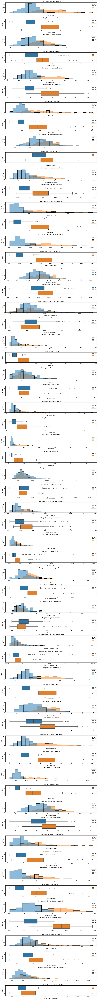

In [41]:
# Tamaño ajustado para la figura
plt.figure(figsize=(12, 4*len(df_copy.columns)))  # Ajustamos el tamaño de la figura

i = 0  # Contador para las posiciones de subgráfico
for var in df_copy.columns:
    if var != 'target':  # No queremos graficar esta columna como variable
        
        # Histograma
        i += 1
        plt.subplot(2*len(df_copy.columns), 1, i)  # Posición en una única columna
        sns.histplot(data=df_copy, x=var, stat="count", hue='target')
        plt.title(f'Histograma de {var}')
        
        # Boxplot
        i += 1
        plt.subplot(2*len(df_copy.columns), 1, i)  # Posición en una única columna
        sns.boxplot(y='target', x=var, data=df_copy, hue='target')
        plt.title(f'Boxplot de {var}')
        plt.legend(loc='upper right')

# Ajuste de diseño para que no se superpongan
plt.tight_layout()
plt.show()

##### Observamos que la mayoría de las características presentan distribuciones distintas según sea el valor de la variable objetivo

### Análisis preliminar de correlaciones

interval columns not set, guessing: ['mean radius', 'mean texture', 'mean perimeter', 'mean area', 'mean smoothness', 'mean compactness', 'mean concavity', 'mean concave points', 'mean symmetry', 'mean fractal dimension', 'radius error', 'texture error', 'perimeter error', 'area error', 'smoothness error', 'compactness error', 'concavity error', 'concave points error', 'symmetry error', 'fractal dimension error', 'worst radius', 'worst texture', 'worst perimeter', 'worst area', 'worst smoothness', 'worst compactness', 'worst concavity', 'worst concave points', 'worst symmetry', 'worst fractal dimension', 'target']


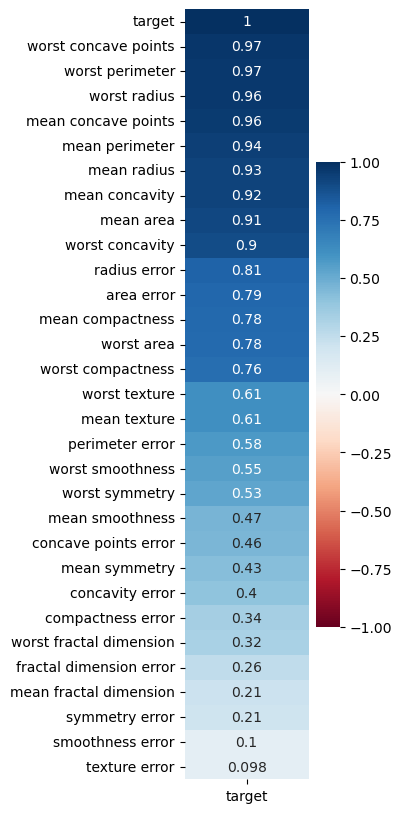

In [44]:
corr_matrix = phik_matrix(df);
target_corr = corr_matrix['target'].sort_values(ascending=False)
plt.figure(figsize=(2, 10))
sns.heatmap(target_corr.to_frame(), cmap='RdBu', vmin=-1, vmax=1, center=0, annot=True, cbar=True)
plt.show()

##### Gran parte de las variables estan altamente correlacionadas con la variable objetivo

#### Verifico las correlaciones entre las variables independientes con el coeficiente de Spearman

In [47]:
X = df.drop(columns = "target")
y = df.loc[:, ['target']]

<Figure size 500x300 with 0 Axes>

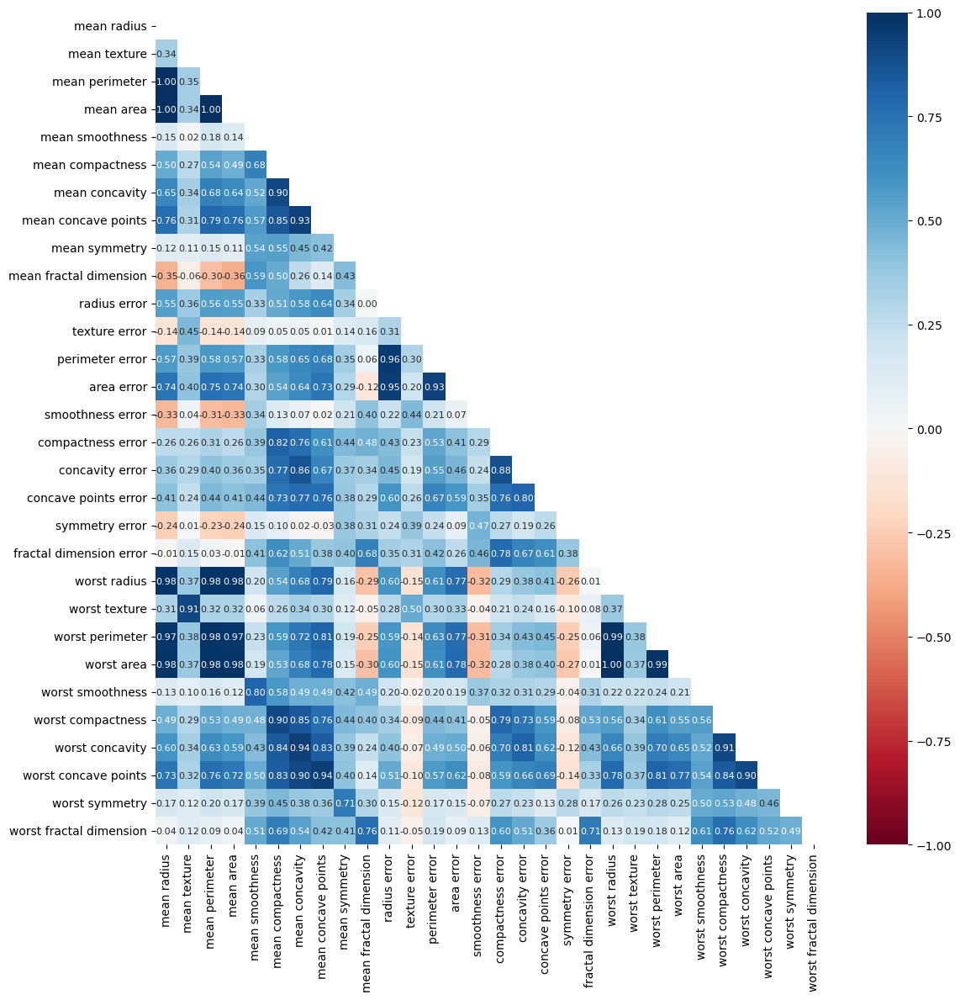

In [48]:
# Ajustar el diseño
plt.tight_layout()
plt.show()

# Calcular la matriz de correlación
corr = X.corr(method='spearman').round(2)

# Crear la máscara para el triángulo superior
mask = np.zeros_like(corr, dtype=bool)
mask[np.triu_indices_from(mask)] = True

# Configurar el tamaño de la figura
plt.figure(figsize=(12, 12))

# Heatmap con tamaño de letras ajustado
sns.heatmap(corr, annot=True, cmap='RdBu', fmt='.2f', mask=mask, vmin=-1, vmax=1, center=0,
            annot_kws={'size': 8},  # Reduce el tamaño de las anotaciones
            # cbar_kws={'label': 'Correlación'},  # Etiqueta para la barra de color
            # xticklabels=5,  # Reduce la cantidad de etiquetas en los ejes x
            # yticklabels=5   # Reduce la cantidad de etiquetas en los ejes y
           )  

# Ajustar el diseño
plt.tight_layout()
plt.show()

##### Como era de suponer, gran parte de las variables estan altamente relacionadas entre sí 

#### Calculo la cantidad de gráficos de dispersión que es posible realizar sin duplicidad

In [51]:
# Convertir el objeto Index a una lista
num_cols_list = enumerate(X.columns)
num_cols = [col for col in num_cols_list]

In [52]:
# Calcular la cantidad total de gráficos de dispersión
total_plots = math.comb(len(num_cols), 2)
total_plots

435

##### Dado el número de variables continuas, la cantidad de combinaciones posibles de gráficos de dispersión es de 435. Para evitar generar tantas gráficas, filtro solo aquellas combinaciones cuya correlación sea superior a un umbral determinado

In [54]:
# Crear una máscara que filtra los valores mayores a 0.7 y diferentes de 1 (evitar la diagonal)
mask = (corr > 0.7) & (corr < 1)

# Obtener los índices de la parte inferior de la matriz (sin la diagonal)
lower_triangle_indices = np.tril_indices_from(corr, k=-1)

# Filtramos los valores de la máscara solo en la parte inferior
mask_lower = mask.values[lower_triangle_indices]

# Contamos cuántas combinaciones cumplen con la condición
combinations = np.sum(mask_lower)

# Si deseas mostrar las combinaciones específicas:
combinations_indices = np.column_stack(lower_triangle_indices)  # Obtener las combinaciones de índices

# Filtrar solo las combinaciones que cumplen con la condición
valid_combinations = [(corr.index[i], corr.columns[j], corr.iloc[i, j])
                      for i, j in combinations_indices if mask.values[i, j]]

# Imprimir el número de combinaciones y las combinaciones específicas
print(f'Número de combinaciones con correlación mayor a 0.7: {combinations}')

# Crear una lista para almacenar las filas del DataFrame
rows = []

# Llenar la lista con las combinaciones válidas
for i, j in combinations_indices:
    if mask.values[i, j]:  # Si la correlación es mayor a 0.7
        rows.append({
            "Variable_1": corr.index[i],
            "Variable_2": corr.columns[j],
            "Correlación": corr.iloc[i, j]
        })

# Crear un DataFrame de pandas a partir de la lista de filas
combinations_df = pd.DataFrame(rows)

Número de combinaciones con correlación mayor a 0.7: 69


#### Grafico los diagramas de dispersión de las variables dependientes más correlacionadas

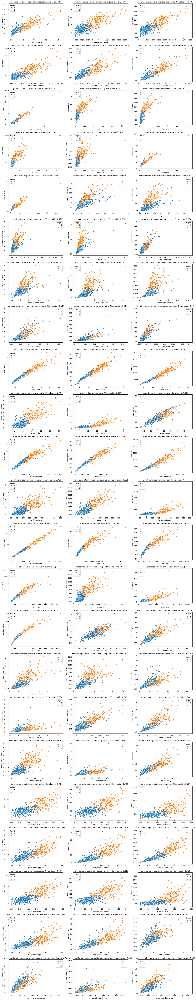

In [56]:
# Determinamos el número de filas necesarias
n_combinations = len(combinations_df)
n_cols = 3  # Número de columnas por fila
n_rows = np.ceil(n_combinations / n_cols).astype(int)  # Número de filas necesarias

# Creamos una figura con n_rows filas y n_cols columnas
fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 6, n_rows * 4))

# Aplanamos el arreglo de ejes para facilitar la indexación
axes = axes.flatten()

# Iteramos sobre las filas de combinations_df y graficamos cada combinación
for idx, (_, row) in enumerate(combinations_df.iterrows()):
    var1, var2 = row["Variable_1"], row["Variable_2"]
    
    # Seleccionamos el eje correspondiente
    ax = axes[idx]
    
    # Graficamos en el eje seleccionado, añadiendo el parámetro hue para colorear por 'target'
    sns.scatterplot(x=df[var1], y=df[var2], ax=ax, hue=df['target'])
    ax.set_title(f'{var1} vs {var2} (Correlación: {row["Correlación"]:.2f})')
    ax.set_xlabel(var1)
    ax.set_ylabel(var2)

# Eliminamos los subgráficos vacíos si no se necesitan
for i in range(n_combinations, len(axes)):
    fig.delaxes(axes[i])

# Ajustamos el layout para que los gráficos no se solapen
plt.tight_layout()

# Mostramos los gráficos
plt.show()

##### Podemos observar que, en general, a medida que aumentan los valores de una de las características, también tienden a aumentar los valores de las otras, lo que incrementa la probabilidad de que la célula sea maligna

### Separo el conjunto de datos en los conjuntos de entrenamiento y prueba

In [59]:
X_train, X_test, y_train, y_test = train_test_split( X,y,test_size = 0.2,random_state = 42, stratify=y)

In [60]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 455 entries, 10 to 335
Data columns (total 30 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   mean radius              455 non-null    float64
 1   mean texture             455 non-null    float64
 2   mean perimeter           455 non-null    float64
 3   mean area                455 non-null    float64
 4   mean smoothness          455 non-null    float64
 5   mean compactness         455 non-null    float64
 6   mean concavity           455 non-null    float64
 7   mean concave points      455 non-null    float64
 8   mean symmetry            455 non-null    float64
 9   mean fractal dimension   455 non-null    float64
 10  radius error             455 non-null    float64
 11  texture error            455 non-null    float64
 12  perimeter error          455 non-null    float64
 13  area error               455 non-null    float64
 14  smoothness error         455 n

In [61]:
X_train.head(4)

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
10,16.02,23.24,102.70,797.8,0.08206,0.06669,0.03299,0.03323,0.1528,0.05697,...,19.19,33.88,123.80,1150.0,0.11810,0.1551,0.1459,0.09975,0.2948,0.08452
170,12.32,12.39,78.85,464.1,0.10280,0.06981,0.03987,0.03700,0.1959,0.05955,...,13.50,15.64,86.97,549.1,0.13850,0.1266,0.1242,0.09391,0.2827,0.06771
407,12.85,21.37,82.63,514.5,0.07551,0.08316,0.06126,0.01867,0.1580,0.06114,...,14.40,27.01,91.63,645.8,0.09402,0.1936,0.1838,0.05601,0.2488,0.08151
430,14.90,22.53,102.10,685.0,0.09947,0.22250,0.27330,0.09711,0.2041,0.06898,...,16.35,27.57,125.40,832.7,0.14190,0.7090,0.9019,0.24750,0.2866,0.11550


## Ingeniería de datos

### Normalizo los datos

In [64]:
# Ajustamos y transformamos las columnas numéricas
X_train_transformed = X_train.copy()

In [65]:
# Inicializamos el YeoJohnsonTransformer de feature_engine
yjt = YeoJohnsonTransformer()

# Ajustamos y transformamos todas las columnas numéricas a la vez
X_train_transformed = yjt.fit_transform(X_train)

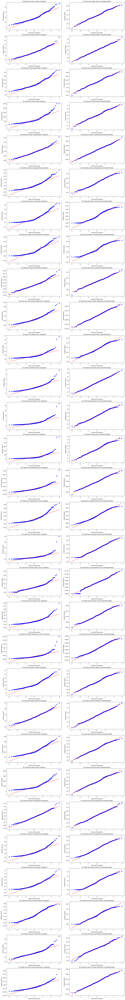

In [66]:
# Función para hacer los Q-Q plots
def make_qqplot(df, original_columns, transformed_df):
    # Crear figura con tamaño dinámico según el número de columnas
    plt.figure(figsize=(15, len(original_columns)*4), constrained_layout=True)
    
    # Graficar Q-Q plot para cada variable
    for i, col in enumerate(original_columns):
        # Subgráfico para la variable original (a la izquierda)
        ax1 = plt.subplot(len(original_columns), 2, 2*i + 1)
        stats.probplot(df[col], dist="norm", plot=ax1)
        ax1.set_title(f'Q-Q plot de {col} (original)')
        
        # Subgráfico para la variable transformada (a la derecha)
        ax2 = plt.subplot(len(original_columns), 2, 2*i + 2)
        # Aplicamos la transformación y mostramos en el gráfico
        stats.probplot(transformed_df[col], dist="norm", plot=ax2)
        ax2.set_title(f'Q-Q plot de {col} (transformada)')

    # Mostrar los gráficos
    plt.show()

# Llamar a la función para generar los Q-Q plots

numerical_columns = X_train.select_dtypes(include=['float']).columns
make_qqplot(X_train, numerical_columns, X_train_transformed)

In [67]:
X_test_transformed = X_test.copy()
X_test_transformed[numerical_columns] = yjt.transform(X_test[numerical_columns])

In [68]:
# Para el pipeline
# ('yeo_johnson', YeoJohnsonTransformer())

### Verifico la presencia de outliers luego de las transformaciones

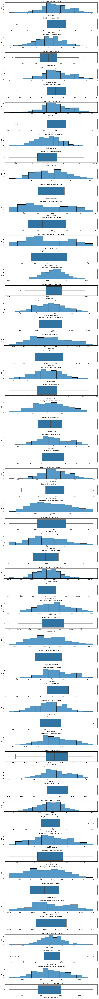

In [70]:
# Tamaño ajustado para la figura
plt.figure(figsize=(12, 4*len(X_train_transformed.columns)))  # Ajustamos el tamaño de la figura

i = 0  # Contador para las posiciones de subgráfico
for var in X_train_transformed.columns:
        
    # Histograma
    i += 1
    plt.subplot(2*len(X_train_transformed.columns), 1, i)  # Posición en una única columna
    sns.histplot(data=X_train_transformed, x=var, stat="count")
    plt.title(f'Histograma de {var}')
    
    # Boxplot
    i += 1
    plt.subplot(2*len(X_train_transformed.columns), 1, i)  # Posición en una única columna
    sns.boxplot(x=var, data=X_train_transformed)
    plt.title(f'Boxplot de {var}')

# Ajuste de diseño para que no se superpongan
plt.tight_layout()
plt.show()

#### Analizo las características que presentan outliers

In [72]:
# Definir la función para contar los valores fuera de los límites
def count_outliers(df):
    outliers_count = {}  # Diccionario para almacenar los resultados

    # Iterar sobre cada columna
    for col in df.columns:
        # Calcular los percentiles 25 (Q1) y 75 (Q3)
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        
        # Calcular el IQR (rango intercuartílico)
        IQR = Q3 - Q1
        
        # Calcular los límites inferior y superior
        lower_limit = Q1 - 1.5 * IQR
        upper_limit = Q3 + 1.5 * IQR
        
        # Contar los valores fuera de los límites
        lower_outliers = (df[col] < lower_limit).sum()
        upper_outliers = (df[col] > upper_limit).sum()
        
        # Guardar el resultado en el diccionario
        outliers_count[col] = {
            "lower_outliers": lower_outliers,
            "upper_outliers": upper_outliers,
            "total_outliers": lower_outliers + upper_outliers
        }
    
    return outliers_count

# Llamar a la función y mostrar los resultados
outliers = count_outliers(X_train_transformed)

In [73]:
# Convertir el diccionario en un DataFrame para una mejor visualización
outliers_df = pd.DataFrame(outliers).T  # Transponer para tener las columnas como índices
outliers_df = outliers_df.sort_values(by=['total_outliers'], ascending=False)
outliers_df

,lower_outliers,upper_outliers,total_outliers
concave points error,11,4,15
worst symmetry,6,4,10
mean symmetry,4,2,6
mean texture,2,3,5
worst smoothness,1,3,4
mean radius,3,0,3
mean perimeter,3,0,3
mean area,3,0,3
worst texture,1,1,2
smoothness error,1,1,2


#### Analizo las filas que presentan outliers

In [75]:
# Función para contar los outliers por fila
def count_outliers_per_row(df):
    # Crear un DataFrame vacío para almacenar los resultados
    outliers_per_row = pd.DataFrame(index=df.index)
    
    for col in df.columns:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        
        lower_limit = Q1 - 1.5 * IQR
        upper_limit = Q3 + 1.5 * IQR
        
        # Crear una columna en outliers_per_row que indique si el valor está fuera de los límites
        outliers_per_row[col] = (df[col] < lower_limit) | (df[col] > upper_limit)
    
    # Contar el número de outliers por fila
    outliers_per_row_count = outliers_per_row.sum(axis=1)
    
    return outliers_per_row_count

# Función para contar cuántas filas tienen n, n-1, n-2, ..., 0 outliers
def count_rows_with_outliers_up_to_max(df):
    # Contamos los outliers por fila
    outliers_per_row_count = count_outliers_per_row(df)
    
    # Encontrar el número máximo de outliers en cualquier fila
    n = outliers_per_row_count.max()
    
    # Diccionario para almacenar el número de filas con x outliers
    rows_with_outliers = {}
    
    for i in range(n + 1):
        # Contar cuántas filas tienen exactamente i outliers
        rows_with_outliers[i] = (outliers_per_row_count == i).sum()
    
    return rows_with_outliers, n

# Llamar a la función para obtener el resultado
rows_with_outliers, n = count_rows_with_outliers_up_to_max(X_train_transformed)

# Mostrar el resultado
print(f"El número máximo de outliers en una fila es: {n}")
for outlier_count, row_count in rows_with_outliers.items():
    print(f"El número de filas con {outlier_count} outliers es: {row_count}")

El número máximo de outliers en una fila es: 7
El número de filas con 0 outliers es: 420
El número de filas con 1 outliers es: 23
El número de filas con 2 outliers es: 6
El número de filas con 3 outliers es: 3
El número de filas con 4 outliers es: 2
El número de filas con 5 outliers es: 0
El número de filas con 6 outliers es: 0
El número de filas con 7 outliers es: 1


In [76]:
# Función para obtener las filas con n outliers
def get_rows_with_n_outliers(df, n):
    # Contamos los outliers por fila
    outliers_per_row_count = count_outliers_per_row(df)
    
    # Filtrar las filas que tienen exactamente n outliers
    rows_with_n_outliers = df[outliers_per_row_count == n]
    
    return rows_with_n_outliers

In [77]:
# Llamar a la función para obtener las filas con n outliers
n = 7  # El valor máximo de outliers
rows_with_n_outliers = get_rows_with_n_outliers(X_train_transformed, n)

In [78]:
indices_with_n_outliers = rows_with_n_outliers.index

# Filtrar el DataFrame original con los índices obtenidos
df_with_n_outliers = df.loc[indices_with_n_outliers]

# Mostrar las filas con exactamente n outliers
print(f"Filas con exactamente {n} outliers en el DataFrame original:")
df_with_n_outliers

Filas con exactamente 7 outliers en el DataFrame original:


,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
101,6.981,13.43,43.79,143.5,0.117,0.07568,0.0,0.0,0.193,0.07818,...,19.54,50.41,185.2,0.1584,0.1202,0.0,0.0,0.2932,0.09382,0


In [79]:
df.describe()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946,0.372583
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061,0.483918
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040,0.000000
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460,0.000000
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040,0.000000
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080,1.000000
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500,1.000000


In [80]:
# Llamar a la función para obtener las filas con n outliers
n = 4  # El valor máximo de outliers
rows_with_n_outliers = get_rows_with_n_outliers(X_train_transformed, n)

indices_with_n_outliers = rows_with_n_outliers.index

# Filtrar el DataFrame original con los índices obtenidos
df_with_n_outliers = df.loc[indices_with_n_outliers]

# Mostrar las filas con exactamente n outliers
print(f"Filas con exactamente {n} outliers en el DataFrame original:")
df_with_n_outliers

Filas con exactamente 4 outliers en el DataFrame original:


,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
538,7.729,25.49,47.98,178.8,0.08098,0.04878,0.0,0.0,0.1870,0.07285,...,30.92,57.17,248.0,0.12560,0.08340,0.0,0.0,0.3058,0.09938,0
192,9.720,18.22,60.73,288.1,0.06950,0.02344,0.0,0.0,0.1653,0.06447,...,20.83,62.25,303.8,0.07117,0.02729,0.0,0.0,0.1909,0.06559,0


In [81]:
# Llamar a la función para obtener las filas con n outliers
n = 3  # El valor máximo de outliers
rows_with_n_outliers = get_rows_with_n_outliers(X_train_transformed, n)

indices_with_n_outliers = rows_with_n_outliers.index

# Filtrar el DataFrame original con los índices obtenidos
df_with_n_outliers = df.loc[indices_with_n_outliers]

# Mostrar las filas con exactamente n outliers
print(f"Filas con exactamente {n} outliers en el DataFrame original:")
df_with_n_outliers

Filas con exactamente 3 outliers en el DataFrame original:


,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
213,17.420,25.56,114.50,948.0,0.10060,0.11460,0.16820,0.06597,0.1308,0.05866,...,28.07,120.40,1021.0,0.12430,0.17930,0.2803,0.1099,0.1603,0.06818,1
561,11.200,29.37,70.67,386.0,0.07449,0.03558,0.00000,0.00000,0.1060,0.05502,...,38.30,75.19,439.6,0.09267,0.05494,0.0000,0.0000,0.1566,0.05905,0
539,7.691,25.44,48.34,170.4,0.08668,0.11990,0.09252,0.01364,0.2037,0.07751,...,31.89,54.49,223.6,0.15960,0.30640,0.3393,0.0500,0.2790,0.10660,0


In [82]:
# Llamar a la función para obtener las filas con n outliers
n = 2  # El valor máximo de outliers
rows_with_n_outliers = get_rows_with_n_outliers(X_train_transformed, n)

indices_with_n_outliers = rows_with_n_outliers.index

# Filtrar el DataFrame original con los índices obtenidos
df_with_n_outliers = df.loc[indices_with_n_outliers]

# Mostrar las filas con exactamente n outliers
print(f"Filas con exactamente {n} outliers en el DataFrame original:")
df_with_n_outliers

Filas con exactamente 2 outliers en el DataFrame original:


,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.20980,0.86630,0.68690,0.25750,0.6638,0.17300,1
166,10.80,9.71,68.77,357.6,0.09594,0.05736,0.02531,0.01698,0.1381,0.06400,...,12.02,73.66,414.0,0.14360,0.12570,0.10470,0.04603,0.2090,0.07699,0
259,15.53,33.56,103.70,744.9,0.10630,0.16390,0.17510,0.08399,0.2091,0.06650,...,49.54,126.30,1035.0,0.18830,0.55640,0.57030,0.20140,0.3512,0.12040,1
491,17.85,13.23,114.60,992.1,0.07838,0.06217,0.04445,0.04178,0.1220,0.05243,...,18.42,127.10,1210.0,0.09862,0.09976,0.10480,0.08341,0.1783,0.05871,0
78,20.18,23.97,143.70,1245.0,0.12860,0.34540,0.37540,0.16040,0.2906,0.08142,...,31.72,170.30,1623.0,0.16390,0.61640,0.76810,0.25080,0.5440,0.09964,1
38,14.99,25.20,95.54,698.8,0.09387,0.05131,0.02398,0.02899,0.1565,0.05504,...,25.20,95.54,698.8,0.09387,0.05131,0.02398,0.02899,0.1565,0.05504,1


##### Podemos corroborar que, cuando los outliers superan la media, la probabilidad de que sean malignos aumenta. Por lo tanto, es recomendable analizar el desempeño de los diferentes modelos, tanto manteniendo como reemplazando los valores extremos.

In [84]:
# Crear el transformador con IQR y un factor de 1.5
winsorizer = Winsorizer(capping_method='iqr', 
                        tail='both',       # 'both' recorta valores de ambos lados (inferior y superior)
                        fold=1.5           # factor para los límites del IQR
                       )

# Aplicar el recorte a las columnas seleccionadas
X_train_cleaned = winsorizer.fit_transform(X_train_transformed)
X_test_cleaned = winsorizer.transform(X_test_transformed)  # Recuerda usar 'transform' para el conjunto de prueba

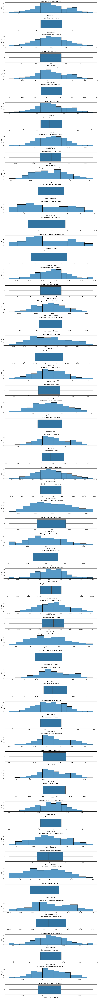

In [85]:
# Tamaño ajustado para la figura
plt.figure(figsize=(12, 4*len(X_train_cleaned.columns)))  # Ajustamos el tamaño de la figura

i = 0  # Contador para las posiciones de subgráfico
for var in X_train_cleaned.columns:
        
    # Histograma
    i += 1
    plt.subplot(2*len(X_train_cleaned.columns), 1, i)  # Posición en una única columna
    sns.histplot(data=X_train_cleaned, x=var, stat="count")
    plt.title(f'Histograma de {var}')
    
    # Boxplot
    i += 1
    plt.subplot(2*len(X_train_cleaned.columns), 1, i)  # Posición en una única columna
    sns.boxplot(x=var, data=X_train_cleaned)
    plt.title(f'Boxplot de {var}')

# Ajuste de diseño para que no se superpongan
plt.tight_layout()
plt.show()

In [86]:
# Para el pipeline
# ('winsorizer', Winsorizer(capping_method='iqr', tail='both', fold=1.5))

### Escalo los valores

In [88]:
scaler = MinMaxScaler().set_output(transform="pandas")

In [89]:
# fit the scaler to the train set, it will learn the parameters
scaler.fit(X_train_cleaned)

MinMaxScaler()

In [90]:
# transform train and test sets
X_train_scale = scaler.transform(X_train_cleaned)
X_test_scale = scaler.transform(X_test_cleaned)

In [91]:
columns = X_train_scale.columns.tolist()

In [92]:
class MinMaxScalerWithOutput(BaseEstimator, TransformerMixin):
    def __init__(self):
        # No hay parámetros adicionales por defecto
        self.scaler = MinMaxScaler().set_output(transform="pandas")  # Configura la salida como pandas DataFrame

    def fit(self, X, y=None):
        """
        Ajusta el transformador. No es necesario usar `y`, pero se incluye por convención.
        """
        self.scaler.fit(X)  # Ajusta el escalador a los datos
        return self  # Devuelve la instancia del objeto para el pipeline

    def transform(self, X):
        """
        Transforma los datos, escalándolos al rango [0, 1].
        """
        return self.scaler.transform(X)  # Devuelve los datos escalados como un DataFrame de pandas

In [93]:
# Para el pipeline
# ('scaler', MinMaxScalerWithOutput()),

### Separo las columnas en tres grupos

In [95]:
mean_columns = [col for col in columns if col.startswith('mean')]
error_columns = [col for col in columns if col.endswith('error')]
worst_columns = [col for col in columns if col.startswith('worst')]

In [96]:
df_train = X_train_scale.copy()
df_train_mean = X_train_scale[mean_columns]
df_train_error = X_train_scale[error_columns]
df_train_worst = X_train_scale[worst_columns]

In [97]:
df_train.shape

(455, 30)

In [98]:
df_test = X_test_scale.copy()
df_test_mean = X_test_scale[mean_columns]
df_test_error = X_test_scale[error_columns]
df_test_worst = X_test_scale[worst_columns]

In [99]:
df_test.shape 

(114, 30)

In [100]:
y_train = y_train.values.flatten()
y_test = y_test.values.flatten()

## Pipeline para preprocesamiento de datos

In [102]:
preprocesor_pipeline = Pipeline([
    ('yeo_johnson', YeoJohnsonTransformer()), 
    ('winsorizer', Winsorizer(capping_method='iqr', tail='both', fold=1.5)), 
    ('scaler', MinMaxScalerWithOutput())
])

### Verifico que el pipeline funcione correctamente

#### Verifico paso a paso las transformaciones del pipeline en un conjunto de muestra

In [105]:
X_raw = X.copy()
prueba_data = X_raw.sample(50)  # Selecciona una muestra pequeña

In [106]:
for nombre, paso in preprocesor_pipeline.steps:
    prueba_data = paso.fit_transform(prueba_data)
    print(f"\nDespués de {nombre}:\n",prueba_data.head(10))


Después de yeo_johnson:
      mean radius  mean texture  mean perimeter  mean area  mean smoothness  \
117     1.259880      2.529063        1.801450   2.848559         0.071423   
353     1.261941      2.842637        1.800801   2.855281         0.066270   
54      1.262134      2.730611        1.800043   2.854553         0.061333   
565     1.300896      2.909010        1.827950   2.926408         0.064412   
134     1.289821      2.727004        1.820202   2.907533         0.062948   
403     1.238555      2.506898        1.783772   2.805561         0.064818   
4       1.301874      2.419316        1.830468   2.929644         0.065431   
564     1.309225      2.742608        1.834669   2.944384         0.069552   
507     1.212437      2.548434        1.766412   2.753640         0.072534   
285     1.234023      2.600790        1.779288   2.799864         0.058339   

     mean compactness  mean concavity  mean concave points  mean symmetry  \
117          0.094060        0.119453 

#### Verifico paso a paso los tipos de datos al aplicar las transformaciones del pipeline en un conjunto de muestra

In [108]:
X_raw = X.copy()
prueba_data = X_raw.sample(50)  # Selecciona una muestra pequeña

In [109]:
for nombre, paso in preprocesor_pipeline.steps:
    prueba_data = paso.fit_transform(prueba_data)
    print(f"\nDespués de {nombre}:\n",prueba_data.dtypes)


Después de yeo_johnson:
 mean radius                float64
mean texture               float64
mean perimeter             float64
mean area                  float64
mean smoothness            float64
mean compactness           float64
mean concavity             float64
mean concave points        float64
mean symmetry              float64
mean fractal dimension     float64
radius error               float64
texture error              float64
perimeter error            float64
area error                 float64
smoothness error           float64
compactness error          float64
concavity error            float64
concave points error       float64
symmetry error             float64
fractal dimension error    float64
worst radius               float64
worst texture              float64
worst perimeter            float64
worst area                 float64
worst smoothness           float64
worst compactness          float64
worst concavity            float64
worst concave points       fl

#### Verifico que el pipeline no genere valores nulos

In [111]:
X_raw = X.copy()
prueba_data = X_raw.sample(50)  # Selecciona una muestra pequeña

In [112]:
for nombre, paso in preprocesor_pipeline.steps:
    prueba_data = paso.fit_transform(prueba_data)
    # Filtrar y mostrar solo las columnas con nulos
    nulos = prueba_data.isnull().sum()
    nulos_con_datos = nulos[nulos > 0]  # Solo columnas con nulos
    print(f"\nNulos después de {nombre}:\n",nulos_con_datos)


Nulos después de yeo_johnson:
 Series([], dtype: int64)

Nulos después de winsorizer:
 Series([], dtype: int64)

Nulos después de scaler:
 Series([], dtype: int64)


### Verifico el resultado final del pipeline

In [114]:
X_pipe_train, X_pipe_test, y_pipe_train, y_pipe_test = train_test_split( X,y,test_size = 0.2,random_state = 42, stratify=y)

In [115]:
X_transformed = preprocesor_pipeline.fit_transform(X_pipe_train)

#### Comparo el dataframe resultante de aplicar el pipeline con el dataframe obtenido al aplicar las transformaciones por manualmente

In [117]:
X_transformed = X_transformed[sorted(X_transformed.columns)]
df_train = df_train[sorted(df_train.columns)]
df_test = df_test[sorted(df_train.columns)]

In [118]:
# Verificar si son iguales
are_equal = X_transformed.equals(df_train)
print("\n¿Son iguales los DataFrames?", are_equal)


¿Son iguales los DataFrames? True


In [119]:
X_transformed.columns.tolist() == df_train.columns.tolist()

True

In [120]:
# Comparamos las diferencias
diferencias = set(X_transformed.columns) - set(df_train.columns)
print("Columnas diferentes:", diferencias)

Columnas diferentes: set()


In [121]:
# Comparamos las diferencias
diferencias = set(df_train.columns) - set(X_transformed.columns)
print("Columnas diferentes:", diferencias)

Columnas diferentes: set()


In [122]:
preprocesor_pipeline_with_ouliers = Pipeline([
    ('yeo_johnson', YeoJohnsonTransformer()), 
    ('scaler', MinMaxScalerWithOutput()) 
])

In [123]:
X_train_with_outliers = preprocesor_pipeline_with_ouliers.fit_transform(X_pipe_train)
X_test_with_outliers = preprocesor_pipeline_with_ouliers.fit_transform(X_pipe_test)

## Busco el mejor modelo

### Defino los espacios y la forma de determinar los mejores parámetros

In [126]:
def objective_logit(trial, X_train, y_train, metric='accuracy'):
    # Definir los parámetros del modelo en un diccionario
    param = {
        'penalty': trial.suggest_categorical('logit_penalty', ['l1', 'l2']),
        'C': trial.suggest_float('logit_c', 1e-5, 1e2, log=True),
        'solver': trial.suggest_categorical('logit_solver', ['liblinear', 'saga']),
        'max_iter': trial.suggest_int('logit_max_iter', 100, 1000),
    }
    
    # Crear el modelo utilizando **param
    model = LogisticRegression(**param)
    model.fit(X_train, y_train)
    score = cross_val_score(model, X_train, y_train, cv=5, scoring=metric).mean()
    
    return score

from sklearn.calibration import CalibratedClassifierCV

def objective_svc(trial, X_train, y_train, metric='accuracy'):
    # Definir los parámetros del modelo en un diccionario
    param = {
        'C': trial.suggest_float('svc_c', 1e-5, 1e2, log=True),
        'kernel': trial.suggest_categorical('svc_kernel', ['linear', 'poly']),
        'gamma': trial.suggest_categorical('svc_gamma', ['scale', 'auto']),
        'degree': trial.suggest_int('svc_degree', 2, 4),
        'random_state': 42
    }
    
    # Crear el modelo base SVC
    model = SVC(**param)
    # Calibrar el modelo para obtener predict_proba
    calibrated_model = CalibratedClassifierCV(model, method='sigmoid', cv=5)
    
    # Usar el modelo calibrado para la validación cruzada
    score = cross_val_score(calibrated_model, X_train, y_train, cv=5, scoring=metric).mean()
    
    return score

def objective_gbm(trial, X_train, y_train, metric='accuracy'):
    # Definir los parámetros del modelo en un diccionario
    param = {
        'n_estimators': trial.suggest_int("gbm_n_estimators", 50, 200),
        'learning_rate': trial.suggest_float("gbm_learning_rate", 0.01, 0.2),
        'max_depth': trial.suggest_int("gbm_max_depth", 1, 25),
        'min_samples_split': trial.suggest_int("gbm_min_samples_split", 2, 100),
        'min_samples_leaf': trial.suggest_int("gbm_min_samples_leaf", 1, 200),
        'max_features': trial.suggest_categorical("gbm_max_features", ['sqrt', 'log2', None]),
        'random_state': 42
    }

    # Crear el modelo utilizando **param
    model = GradientBoostingClassifier(**param)    
    model.fit(X_train, y_train)
    score = cross_val_score(model, X_train, y_train, cv=5, scoring=metric).mean()
    
    return score

def objective_knn(trial, X_train, y_train, metric='accuracy'):
    # Definir los parámetros del modelo en un diccionario
    param = {
        'n_neighbors': trial.suggest_int('knn_n_neighbors', 3, 49, step=2),
        'weights': trial.suggest_categorical('knn_weights', ['uniform', 'distance']),
        'p': trial.suggest_int('knn_p', 1, 2),
    }

    # Crear el modelo utilizando **param
    model = KNeighborsClassifier(**param)
    
    model.fit(X_train, y_train)
    score = cross_val_score(model, X_train, y_train, cv=5, scoring=metric).mean()
    
    return score

def objective_naive(trial, X_train, y_train, metric='accuracy'):
    # Definir los parámetros del modelo en un diccionario
    param = {
        'var_smoothing': trial.suggest_float('naive_var_smoothing', 1e-3, 1e0, log=True)
    }

    # Crear el modelo utilizando **param
    model = GaussianNB(**param)
    
    model.fit(X_train, y_train)
    score = cross_val_score(model, X_train, y_train, cv=5, scoring=metric).mean()
    
    return score

def objective_rf(trial, X_train, y_train, metric='accuracy'):
    # Definir los parámetros del modelo en un diccionario
    param = {
        'n_estimators': trial.suggest_int("rf_n_estimators", 50, 300),
        'max_depth': trial.suggest_int("rf_max_depth", 1, 30),
        'min_samples_split': trial.suggest_int("rf_min_samples_split", 2, 400),
        'min_samples_leaf': trial.suggest_int("rf_min_samples_leaf", 1, 400),
        'max_features': trial.suggest_categorical("rf_max_features", [None, 'sqrt', 'log2']),
        'bootstrap': trial.suggest_categorical("rf_bootstrap", [True, False]),
        'random_state': 42
    }
    
    # Crear el modelo utilizando **param
    model = RandomForestClassifier(**param)
    model.fit(X_train, y_train)
    score = cross_val_score(model, X_train, y_train, cv=5, scoring=metric).mean()
    
    return score

def objective_dt(trial, X_train, y_train, metric='accuracy'):
    # Definir los parámetros del modelo en un diccionario
    param = {
        'max_depth': trial.suggest_int("dt_max_depth", 1, 20),
        'min_samples_split': trial.suggest_int("dt_min_samples_split", 2, 400),
        'min_samples_leaf': trial.suggest_int("dt_min_samples_leaf", 1, 400),
        'criterion': trial.suggest_categorical("dt_criterion", ["gini", "entropy"]),
        'random_state': 42
    }

    # Crear el modelo utilizando **param
    model = DecisionTreeClassifier(**param)
    
    model.fit(X_train, y_train)
    score = cross_val_score(model, X_train, y_train, cv=5, scoring=metric).mean()
    
    return score

def objective_lgbm(trial, X_train, y_train, metric='accuracy'):
    # Definir los parámetros del modelo en un diccionario
    param = {
        'objective': 'binary',
        'metric': 'auc',
        'verbosity': -1,
        'boosting_type': 'gbdt',
        'num_leaves': trial.suggest_int('num_leaves', 20, 100),
        'max_depth': trial.suggest_int('max_depth', 2, 10),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        'n_estimators': trial.suggest_int('n_estimators', 50, 1000),
        'min_child_samples': trial.suggest_int('min_child_samples', 20, 500),
        'min_child_weight': trial.suggest_float('min_child_weight', 1e-5, 1e-2, log=True), 
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
        'reg_alpha': trial.suggest_float('reg_alpha', 0, 1.0),
        'reg_lambda': trial.suggest_float('reg_lambda', 0, 1.0),
        'random_state': 42,
#        'class_weight': 'balanced'  # Address class imbalance
    }

    # Crear el modelo utilizando **param
    model = lgb.LGBMClassifier(**param, verbose=0)
    
    model.fit(X_train, y_train)
    score = cross_val_score(model, X_train, y_train, cv=5, scoring=metric).mean()
    
    return score

### Determino la métrica a optimizar y busco los mejores parámetros para cada modelo

In [128]:
# Interesa optimizar tanto el recall como la presición
chosen_metric = 'recall'

In [129]:
# Diccionario con los modelos y sus funciones objective correspondientes
model_dict = {
    'lgbm': objective_lgbm,
    'knn': objective_knn,
    'naive': objective_naive,
    'dt': objective_dt,
    'logit': objective_logit,
    'rf': objective_rf,
    'gbm': objective_gbm
}

In [130]:
# Intentar leer el archivo CSV, si no existe, ejecutar la optimización
try:
    # Intentar leer el archivo CSV
    trials_df1 = pd.read_csv("../Breast Cancer/parameters_trials.csv")
    print("Archivo leído correctamente.\n")

except FileNotFoundError:
    # Si el archivo no existe, ejecutar la optimización
    print("Archivo no encontrado. Ejecutando optimización...")

    best_params_df = pd.DataFrame(columns=["model", "params", "score"])  # Agregar columna para la métrica

    # Loop sobre los modelos
    for model_name, objective_func in model_dict.items():
        # Crear el estudio para cada modelo
        study = optuna.create_study(direction='maximize', pruner=HyperbandPruner())

        # Optimizar el modelo con Optuna utilizando su función objective correspondiente
        study.optimize(lambda trial: objective_func(trial, df_train, y_train, metric = chosen_metric), n_trials = 100)

        # Obtener los mejores parámetros y la mejor puntuación
        best_params = study.best_params
        best_score = study.best_value  # Obtiene la mejor puntuación (por ejemplo, accuracy o roc_auc)

        # Imprimir mensaje indicando que la búsqueda terminó para el modelo actual
        print(f'Búsqueda en {model_name} finalizada')
        
        # Guardar en el DataFrame usando pd.concat()
        best_params_df = pd.concat([best_params_df, pd.DataFrame([{"model": model_name, 
                                                                   "params": best_params, 
                                                                   "score": best_score}])], ignore_index=True)

    # Guardar los resultados en un archivo CSV
    best_params_df.to_csv("../Breast Cancer/parameters_trials.csv", index=False)
    print("Resultados guardados en parameters_trials.csv")

# Leer el archivo CSV después de guardar
trials_df1 = pd.read_csv("../Breast Cancer/parameters_trials.csv")
print("Archivo leído correctamente después de la optimización.\n")

Archivo leído correctamente.

Archivo leído correctamente después de la optimización.



In [131]:
trials_df1

,model,params,score
0,lgbm,"{'num_leaves': 49, 'max_depth': 4, 'learning_r...",0.958824
1,knn,"{'knn_n_neighbors': 3, 'knn_weights': 'uniform...",0.935294
2,naive,{'naive_var_smoothing': 0.14192865880430683},0.905882
3,dt,"{'dt_max_depth': 7, 'dt_min_samples_split': 29...",0.964706
4,logit,"{'logit_penalty': 'l1', 'logit_c': 39.36678540...",0.964706
5,rf,"{'rf_n_estimators': 281, 'rf_max_depth': 8, 'r...",0.941176
6,gbm,"{'gbm_n_estimators': 173, 'gbm_learning_rate':...",0.964706


#### Corrijo los nombres de los parámetros

In [133]:
def remove_prefix_and_modify_params(params, model_name, prefix):
    """Elimina el prefijo de los parámetros y cambia 'c' a 'C' para logit y svc."""
    
    # Eliminar el prefijo de los parámetros
    new_params = {}
    for key, value in params.items():

        # Eliminar el prefijo y mantener el valor del parámetro
        if key.startswith(prefix):
            new_key = key[len(prefix):]  # Eliminar el prefijo
        else:
            new_key = key  # Si no tiene prefijo, usamos la clave original

        # Cambiar 'c' a 'C' para los modelos logit y svc
        if model_name in ['logit', 'svc'] and new_key == 'c':
            print(f"Se encontró 'c' como clave para {model_name}. Cambiando a 'C'.")
            new_key = 'C'  # Cambiar 'c' a 'C'

        new_params[new_key] = value
    
    return new_params

# Recorremos cada fila del DataFrame y removemos el prefijo de los parámetros
for index, row in trials_df1.iterrows():
    # Cargar los parámetros de la columna 'params' como diccionario
    params = eval(row['params'])  # Convertir string a diccionario

    # Obtener el nombre del modelo
    model_name = row['model']
    
    # Si el modelo es 'lgbm', no hay prefijo; en otros casos, usamos el nombre del modelo seguido de un guion bajo
    if model_name == "lgbm":
        prefix = ""
    else:
        prefix = f"{model_name}_"

    # Remover el prefijo y cambiar 'c' a 'C' si es necesario
    new_params = remove_prefix_and_modify_params(params, model_name, prefix)

    # Actualizar la columna 'params' con los nuevos parámetros sin prefijo
    trials_df1.at[index, 'params'] = new_params

# Imprimir el DataFrame actualizado después de la depuración
print("\nDataFrame actualizado:")
print(trials_df1)

Se encontró 'c' como clave para logit. Cambiando a 'C'.

DataFrame actualizado:
   model                                             params     score
0   lgbm  {'num_leaves': 49, 'max_depth': 4, 'learning_r...  0.958824
1    knn   {'n_neighbors': 3, 'weights': 'uniform', 'p': 2}  0.935294
2  naive             {'var_smoothing': 0.14192865880430683}  0.905882
3     dt  {'max_depth': 7, 'min_samples_split': 298, 'mi...  0.964706
4  logit  {'penalty': 'l1', 'C': 39.3667854011617, 'solv...  0.964706
5     rf  {'n_estimators': 281, 'max_depth': 8, 'min_sam...  0.941176
6    gbm  {'n_estimators': 173, 'learning_rate': 0.15921...  0.964706


### Evaluación de los modelos

In [135]:
def resultados(y, y_pred, y_proba=None):
    """
    Esta función evalúa el rendimiento de un modelo de clasificación utilizando
    una matriz de confusión y, si se proporcionan probabilidades, la curva AUC-ROC.
    
    Parámetros:
    - y: array-like, valores verdaderos de las etiquetas de clase (etiquetas reales).
    - y_pred: array-like, valores predichos por el modelo (etiquetas predichas).
    - y_proba: array-like, probabilidades predichas por el modelo (opcional).
    """
    # Matriz de confusión
    conf_matrix = confusion_matrix(y, y_pred, normalize='true')
    
    # Configuración de la figura
    if y_proba is None:
        fig, ax = plt.subplots(figsize=(5, 4))  # Una sola figura si no hay `y_proba`
        sns.heatmap(conf_matrix, annot=True, cmap='Blues', vmin=0, vmax=1, center=0.5, ax=ax)
        ax.set_title("Matriz de Confusión")
        ax.set_ylabel('Real')
        ax.set_xlabel('Predicho')
    else:
        fig, axes = plt.subplots(1, 2, figsize=(10, 4))  # Dos subfiguras si hay `y_proba`
        
        # Graficar la matriz de confusión
        sns.heatmap(conf_matrix, annot=True, cmap='Blues', vmin=0, vmax=1, center=0.5, ax=axes[0])
        axes[0].set_title("Matriz de Confusión")
        axes[0].set_ylabel('Real')
        axes[0].set_xlabel('Predicho')
        
        # Calcular y graficar la curva AUC-ROC
        fpr, tpr, _ = roc_curve(y, y_proba)
        auc_score = roc_auc_score(y, y_proba)
        axes[1].plot(fpr, tpr, label=f'AUC = {auc_score:.2f}')
        axes[1].plot([0, 1], [0, 1], 'k--')  # Línea diagonal para referencia
        axes[1].set_title("Curva AUC-ROC")
        axes[1].set_xlabel("False Positive Rate")
        axes[1].set_ylabel("True Positive Rate")
        axes[1].legend()
    
    plt.tight_layout()
    plt.show()
    
    # Reporte de clasificación
    print(classification_report(y, y_pred))

In [136]:
def model_evaluation(model, X_train, y_train, metric='accuracy'):
    """
    Esta función evalúa el rendimiento del modelo utilizando K-Fold Cross-Validation
    y devuelve métricas de rendimiento, así como el riesgo de sobreajuste.

    Parámetros:
    - model: el modelo a evaluar.
    - X_train: conjunto de datos de entrenamiento.
    - y_train: etiquetas del conjunto de entrenamiento.

    Retorna:
    - df: DataFrame con las métricas de rendimiento.
    - overfitting_risk: diccionario con información sobre el riesgo de sobreajuste.
    """
    # K-Fold Cross-Validation
    kf = KFold(n_splits=5, shuffle=True, random_state=42)

    try:
        # Estimación del error de generalización
        clf = cross_validate(
            model,
            X_train,
            y_train,
            scoring= metric,
            return_train_score=True,
            cv=kf
        )

        # Calcular valores para el conjunto de entrenamiento
        mean_train_score = np.mean(clf['train_score'])
        std_train_score = np.std(clf['train_score'])

        # Calcular el intervalo para el conjunto de entrenamiento
        interval_lower_train = mean_train_score - 3 * std_train_score
        interval_upper_train = mean_train_score + 3 * std_train_score

        # Calcular el puntaje medio y el intervalo para el conjunto de prueba
        mean_test_score = np.mean(clf['test_score']) if 'test_score' in clf else np.nan
        std_test_score = np.std(clf['test_score']) if 'test_score' in clf else np.nan

        # Calcular el intervalo para el conjunto de prueba
        interval_lower_test = mean_test_score - 3 * std_test_score if not np.isnan(mean_test_score) else np.nan
        interval_upper_test = mean_test_score + 3 * std_test_score if not np.isnan(mean_test_score) else np.nan

        # Crear el DataFrame con las métricas
        df = pd.DataFrame({
            'mean': [mean_train_score, mean_test_score],
            'std': [std_train_score, std_test_score],
            'interval_lower': [interval_lower_train, interval_lower_test],
            'interval_upper': [interval_upper_train, interval_upper_test]
        }, index=['train_set', 'test_set'])

        # Prueba t para comparar las puntuaciones de entrenamiento y prueba
        t_stat, p_value = stats.ttest_ind(clf['train_score'], clf['test_score'], equal_var=False)

        # Diccionario con la probabilidad de sobreajuste
        overfitting_risk = {
            't_statistic': t_stat,
            'p_value': p_value,
            'overfitting_likelihood': 'High' if p_value < 0.10 else 'Low'
        }

        return df, overfitting_risk

    except Exception as e:
        print(f"Error al evaluar el modelo: {e}")
        return None, None

In [137]:
model_dict = {
    'gbm': GradientBoostingClassifier,
    'knn': KNeighborsClassifier,
    'naive': GaussianNB,
    'dt': DecisionTreeClassifier,
    'lgbm': lgb.LGBMClassifier,
    'logit': LogisticRegression,
    'rf': RandomForestClassifier,
    'svc': SVC
}

In [138]:
y_train.shape

(455,)

In [139]:
import os

In [140]:
# Nombre del archivo CSV relacionado con "comportamiento_mejores_parametros"
csv_filename = "best_params_results.csv"

# Verifica si el archivo ya existe
if os.path.exists(csv_filename):
    # Si el archivo existe, solo se lee y se omite el proceso de evaluación y guardado
    results_df = pd.read_csv(csv_filename)
    print("El archivo ya existe. Se han cargado los resultados desde el archivo.")
else:
    # Si el archivo no existe, se realiza el cálculo y se guarda el archivo
    results_df = pd.DataFrame(columns=["model", "mean_train_score", "std_train_score", "interval_lower_train", 
                                       "interval_upper_train", "mean_test_score", "std_test_score", 
                                       "interval_lower_test", "interval_upper_test", "overfitting_risk", "p_value"])

    # Para cada modelo en trials_df1, crea y entrena el modelo utilizando los parámetros
    for index, row in trials_df1.iterrows():
        model_name = row['model']
        params = row['params']

        # Si el modelo es 'lgbm', no necesita prefijo como los otros modelos
        if model_name != 'lgbm':
            # Remover el prefijo (modelo_name + "_") de los parámetros
            params = {k.replace(f'{model_name}_', ''): v for k, v in params.items()}

        # Crear el modelo usando los parámetros
        model_class = model_dict[model_name]
        model = model_class(**params)

        # # Dividir el dataset en entrenamiento y validación
        # X_train_cv, X_valid, y_train_cv, y_valid = train_test_split(df_train, y_train, test_size=0.2, random_state=42) # Cuando entra al if esta sobreescribiendo los train

        # Evaluar el modelo usando la función 'model_evaluation'
        df, overfitting_risk = model_evaluation(model, df_train, y_train, metric = chosen_metric)

        # Extraer los resultados de la evaluación
        mean_train_score = df.loc['train_set', 'mean']
        std_train_score = df.loc['train_set', 'std']
        interval_lower_train = df.loc['train_set', 'interval_lower']
        interval_upper_train = df.loc['train_set', 'interval_upper']
        
        mean_test_score = df.loc['test_set', 'mean']
        std_test_score = df.loc['test_set', 'std']
        interval_lower_test = df.loc['test_set', 'interval_lower']
        interval_upper_test = df.loc['test_set', 'interval_upper']

        # Extraer el valor p
        p_value = overfitting_risk.get('p_value', 1.0)

        # Crear un diccionario con los resultados para agregar al DataFrame
        results = {
            "model": model_name,
            "mean_train_score": mean_train_score,
            "std_train_score": std_train_score,
            "interval_lower_train": interval_lower_train,
            "interval_upper_train": interval_upper_train,
            "mean_test_score": mean_test_score,
            "std_test_score": std_test_score,
            "interval_lower_test": interval_lower_test,
            "interval_upper_test": interval_upper_test,
            "overfitting_risk": overfitting_risk['overfitting_likelihood'],
            "p_value": p_value
        }

        # Agregar los resultados al DataFrame de resultados
        results_df = pd.concat([results_df, pd.DataFrame([results])], ignore_index=True)
    
    # Guardar los resultados en el archivo CSV
    results_df.to_csv(csv_filename, index=False)
    print("El archivo ha sido creado y los resultados han sido guardados.")

El archivo ya existe. Se han cargado los resultados desde el archivo.


In [141]:
y_train.shape

(455,)

In [142]:
results_df

,model,mean_train_score,std_train_score,interval_lower_train,interval_upper_train,mean_test_score,std_test_score,interval_lower_test,interval_upper_test,overfitting_risk,p_value
0,lgbm,1.000000,0.000000,1.000000,1.000000,0.954666,0.036334,0.845664,1.063668,High,0.067095
1,knn,0.970630,0.008049,0.946484,0.994777,0.931775,0.043865,0.800179,1.063370,Low,0.151845
2,naive,0.909124,0.015548,0.862480,0.955769,0.910440,0.062150,0.723989,1.096892,Low,0.968995
3,dt,0.966325,0.006789,0.945957,0.986694,0.959916,0.027834,0.876413,1.043419,Low,0.675375
4,logit,0.986842,0.008597,0.961050,1.012634,0.946651,0.029651,0.857696,1.035605,High,0.051344
5,rf,0.955740,0.007337,0.933730,0.977750,0.935849,0.035889,0.828181,1.043518,Low,0.334163
6,gbm,0.988258,0.005736,0.971050,1.005465,0.935836,0.034797,0.831446,1.040226,High,0.038389


#### Grafico los resultados para poder compararlos

In [144]:
from matplotlib.colors import Normalize, LinearSegmentedColormap

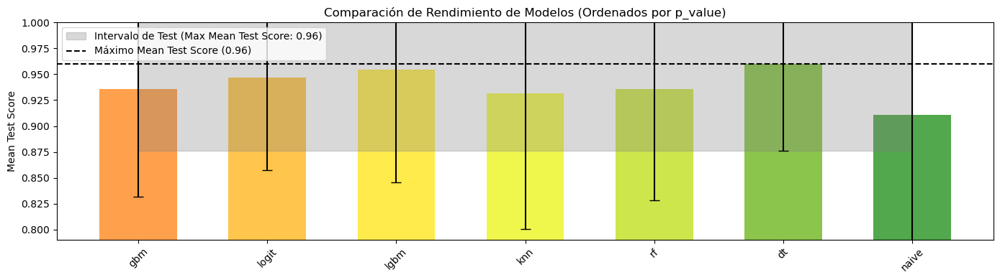

In [145]:
# Ordenar el DataFrame por el valor p creciente
results_df_sorted = results_df.sort_values(by='p_value')

# Crear el gráfico de barras
plt.figure(figsize=(14, 4))  # Ajustar el tamaño de la figura
bar_width = 0.6  # Hacer las barras el doble de anchas

# Obtener todos los modelos únicos después de ordenar
all_models = results_df_sorted['model'].unique()  # Obtener los modelos únicos

# Inicializar posición base
x_pos = np.arange(len(all_models))

# Crear un colormap personalizado para los valores p (ajustado a tus indicaciones)
colors = LinearSegmentedColormap.from_list(
    "p_value_gradient", [(0, 'red'), (0.075, 'yellow'), (1, 'green')])

# Normalizar los valores p de acuerdo con el rango entre 0 y 1
norm = Normalize(vmin=0, vmax=1)

# Graficar las métricas de test (mean_test_score y std_test_score)
max_mean_test_score = -np.inf  # Para encontrar el mayor mean_test_score
interval_lower_test_max = None  # Para almacenar el valor del intervalo inferior
interval_upper_test_max = None  # Para almacenar el valor del intervalo superior
min_mean_test_score = np.inf  # Para encontrar el menor mean_test_score

for i, model in enumerate(all_models):
    # Filtrar los datos para cada modelo
    filtered_df = results_df_sorted[results_df_sorted['model'] == model]
    
    # Obtener las métricas del modelo
    mean_test_score = filtered_df['mean_test_score'].values[0]
    test_std = filtered_df['std_test_score'].values[0] * 3  # Multiplicar la desviación estándar por 3
    p_value = filtered_df['p_value'].values[0]
    
    # Obtener los límites del intervalo de test
    interval_lower_test = filtered_df['interval_lower_test'].values[0]
    interval_upper_test = filtered_df['interval_upper_test'].values[0]
    
    # Actualizar el máximo y el mínimo mean_test_score, así como los límites del intervalo
    if mean_test_score > max_mean_test_score:
        max_mean_test_score = mean_test_score
        interval_lower_test_max = interval_lower_test
        interval_upper_test_max = interval_upper_test
    if mean_test_score < min_mean_test_score:
        min_mean_test_score = mean_test_score

    # Asignar el color basado en el valor p usando el colormap
    color = colors(norm(p_value))  # Aplicar normalización y obtener el color

    # Posicionar las barras
    plt.bar(x_pos[i], mean_test_score, yerr=test_std, capsize=5, 
            color=color, width=bar_width, alpha=0.7)

# Añadir una banda translucida entre interval_lower_test_max y interval_upper_test_max
plt.fill_between(
    [0, len(all_models) - 1],  # Todo el ancho del gráfico
    interval_lower_test_max, interval_upper_test_max,
    color='gray', alpha=0.3, label=f'Intervalo de Test (Max Mean Test Score: {max_mean_test_score:.2f})'
)

# Añadir línea horizontal en el valor máximo de mean_test_score
plt.axhline(y=max_mean_test_score, color='black', linestyle='--', label=f'Máximo Mean Test Score ({max_mean_test_score:.2f})')

# Añadir etiquetas y título
plt.title('Comparación de Rendimiento de Modelos (Ordenados por p_value)')
plt.xticks(x_pos, all_models, rotation=45)
plt.ylabel('Mean Test Score')

# Ajustar el límite del eje y
plt.ylim(min_mean_test_score - 0.12, 1.0)  # Se ajusta el límite inferior para incluir el valor mínimo

# Añadir leyenda
plt.legend(loc='upper left')

# Mostrar el gráfico
plt.tight_layout()
plt.show()

### Evaluo el desempeño de los modelos más prometedores

In [147]:
knn_best_params = trials_df1[trials_df1['model'] == 'knn']['params'].iloc[0]
print(knn_best_params)

{'n_neighbors': 3, 'weights': 'uniform', 'p': 2}


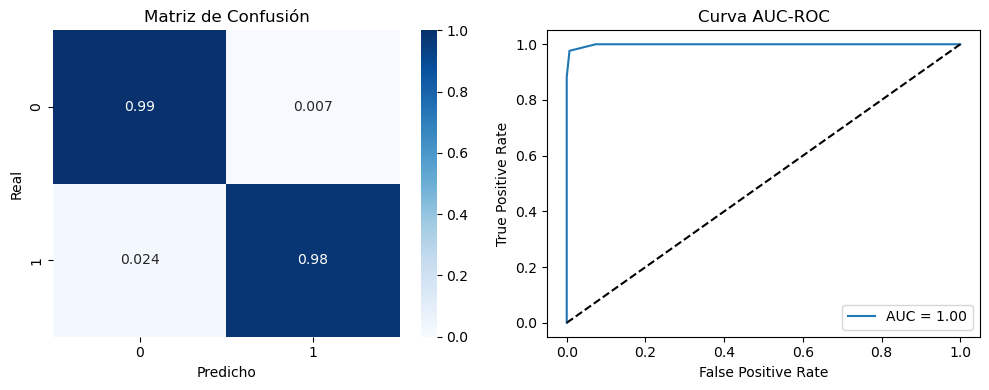

              precision    recall  f1-score   support

           0       0.99      0.99      0.99       285
           1       0.99      0.98      0.98       170

    accuracy                           0.99       455
   macro avg       0.99      0.98      0.99       455
weighted avg       0.99      0.99      0.99       455



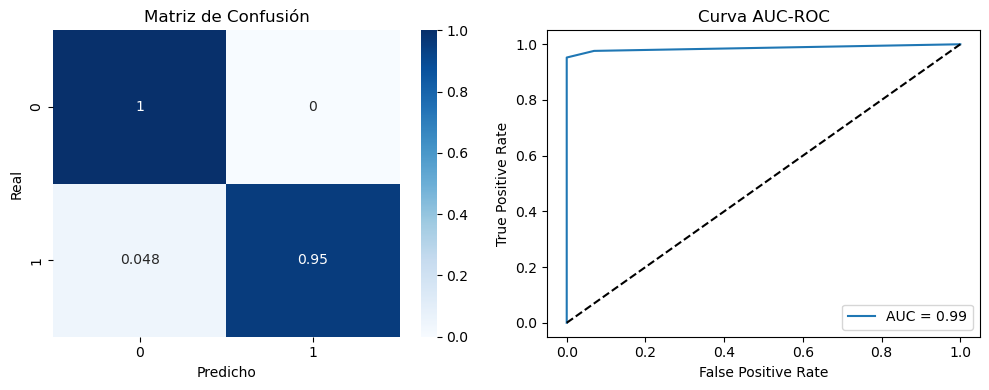

              precision    recall  f1-score   support

           0       0.97      1.00      0.99        72
           1       1.00      0.95      0.98        42

    accuracy                           0.98       114
   macro avg       0.99      0.98      0.98       114
weighted avg       0.98      0.98      0.98       114



In [148]:
knn_classifier = KNeighborsClassifier(**knn_best_params)
knn_classifier.fit(df_train, y_train)
y_train_pred = knn_classifier.predict(X = df_train)
y_test_pred = knn_classifier.predict(X = df_test)
y_train_proba = knn_classifier.predict_proba(df_train)[:, 1]
y_test_proba = knn_classifier.predict_proba(df_test)[:, 1]
resultados(y_train, y_train_pred, y_train_proba)
resultados(y_test, y_test_pred, y_test_proba)

In [149]:
gbm_best_params = trials_df1[trials_df1['model'] == 'gbm']['params'].iloc[0]
print(gbm_best_params)

{'n_estimators': 173, 'learning_rate': 0.1592104658905141, 'max_depth': 1, 'min_samples_split': 93, 'min_samples_leaf': 132, 'max_features': 'sqrt'}


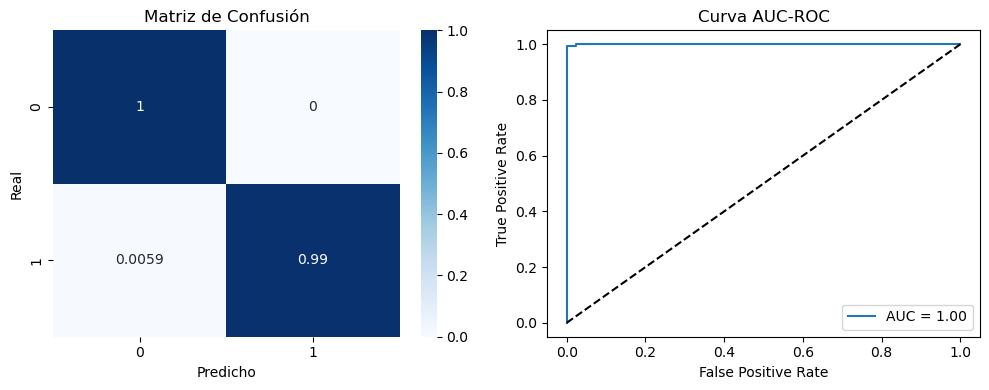

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       285
           1       1.00      0.99      1.00       170

    accuracy                           1.00       455
   macro avg       1.00      1.00      1.00       455
weighted avg       1.00      1.00      1.00       455



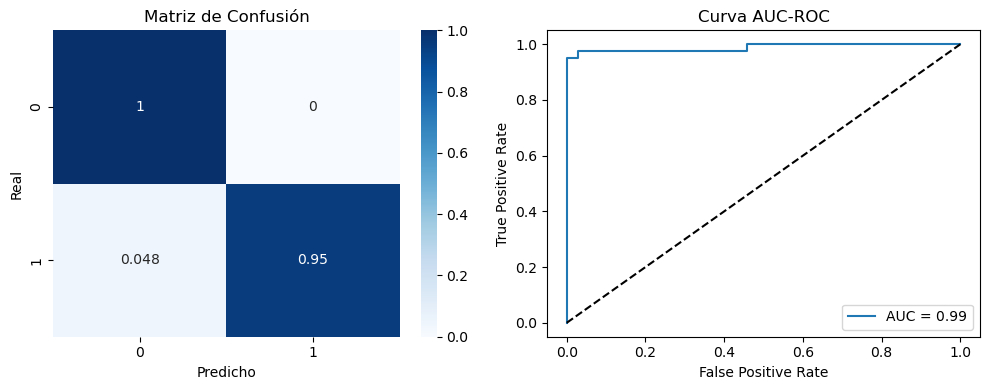

              precision    recall  f1-score   support

           0       0.97      1.00      0.99        72
           1       1.00      0.95      0.98        42

    accuracy                           0.98       114
   macro avg       0.99      0.98      0.98       114
weighted avg       0.98      0.98      0.98       114



In [150]:
gbm_classifier = GradientBoostingClassifier(**gbm_best_params)
gbm_classifier.fit(df_train, y_train)
y_train_pred = gbm_classifier.predict(X = df_train)
y_test_pred = gbm_classifier.predict(X = df_test)
y_train_proba = gbm_classifier.predict_proba(df_train)[:, 1]
y_test_proba = gbm_classifier.predict_proba(df_test)[:, 1]
resultados(y_train, y_train_pred, y_train_proba)
resultados(y_test, y_test_pred, y_test_proba)

##### Pruebo GradientBoostingClassifier con el conjunto con outliers

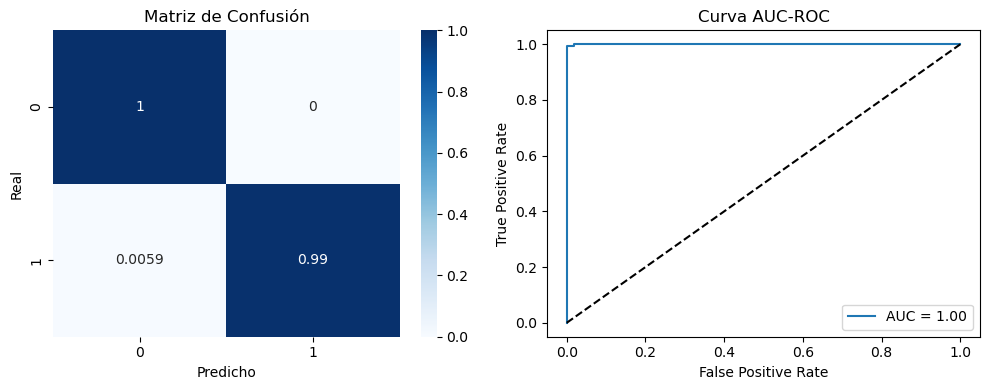

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       285
           1       1.00      0.99      1.00       170

    accuracy                           1.00       455
   macro avg       1.00      1.00      1.00       455
weighted avg       1.00      1.00      1.00       455



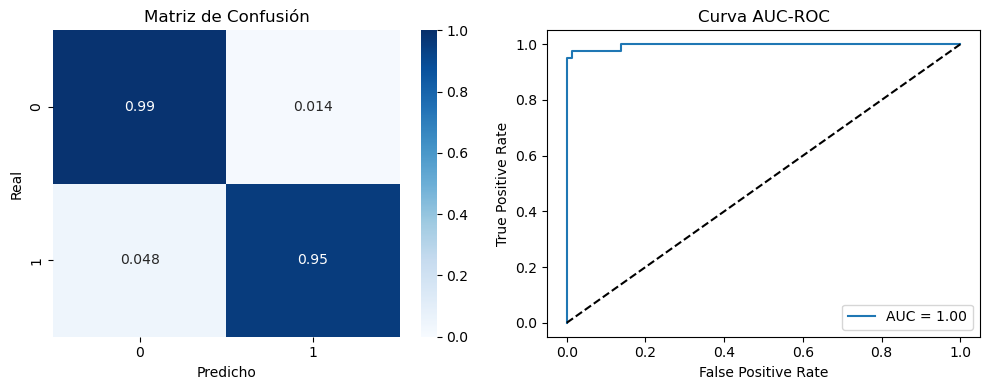

              precision    recall  f1-score   support

           0       0.97      0.99      0.98        72
           1       0.98      0.95      0.96        42

    accuracy                           0.97       114
   macro avg       0.97      0.97      0.97       114
weighted avg       0.97      0.97      0.97       114



In [152]:
gbm_classifier = GradientBoostingClassifier(**gbm_best_params)
gbm_classifier.fit(X_train_with_outliers, y_train)
y_train_pred = gbm_classifier.predict(X = X_train_with_outliers)
y_test_pred = gbm_classifier.predict(X = X_test_with_outliers)
y_train_proba = gbm_classifier.predict_proba(X_train_with_outliers)[:, 1]
y_test_proba = gbm_classifier.predict_proba(X_test_with_outliers)[:, 1]
resultados(y_train, y_train_pred, y_train_proba)
resultados(y_test, y_test_pred, y_test_proba)

In [153]:
logit_best_params = trials_df1[trials_df1['model'] == 'logit']['params'].iloc[0]
print(logit_best_params)

{'penalty': 'l1', 'C': 39.3667854011617, 'solver': 'liblinear', 'max_iter': 902}


In [154]:
logit_best_params['random_state'] = 42

In [155]:
logit_classifier = LogisticRegression(**logit_best_params)
logit_classifier.fit(df_train, y_train)
y_train_pred = logit_classifier.predict(X = df_train)
y_test_pred = logit_classifier.predict(X = df_test)
y_train_proba = logit_classifier.predict_proba(df_train)[:, 1]
y_test_proba = logit_classifier.predict_proba(df_test)[:, 1]

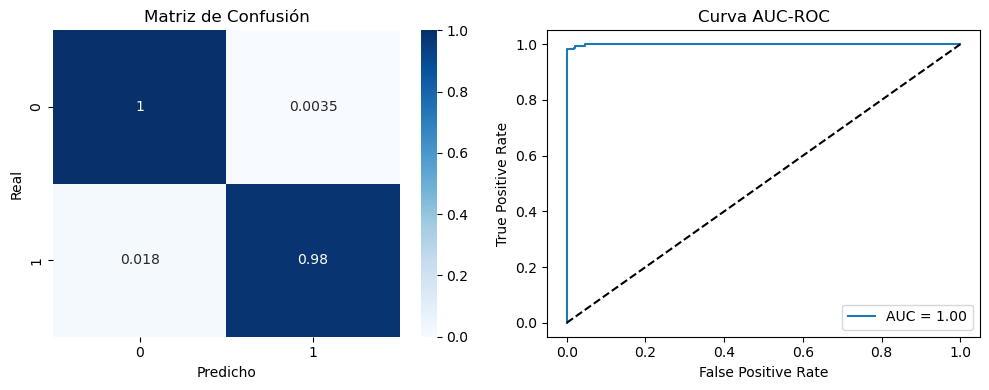

              precision    recall  f1-score   support

           0       0.99      1.00      0.99       285
           1       0.99      0.98      0.99       170

    accuracy                           0.99       455
   macro avg       0.99      0.99      0.99       455
weighted avg       0.99      0.99      0.99       455



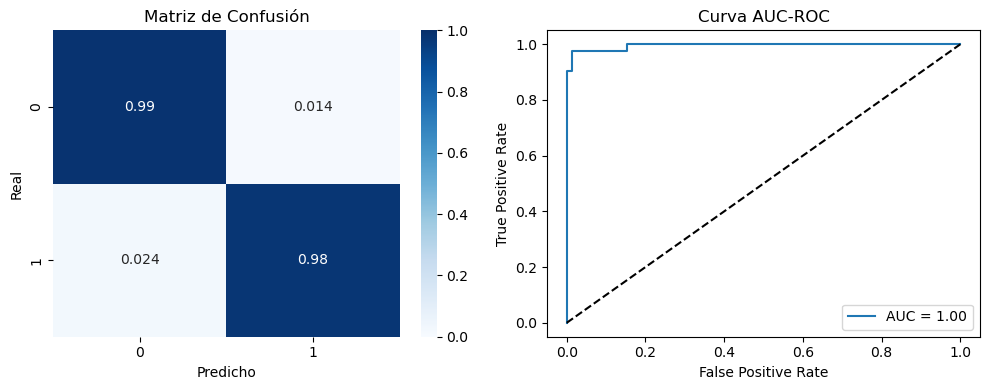

              precision    recall  f1-score   support

           0       0.99      0.99      0.99        72
           1       0.98      0.98      0.98        42

    accuracy                           0.98       114
   macro avg       0.98      0.98      0.98       114
weighted avg       0.98      0.98      0.98       114



In [156]:
resultados(y_train, y_train_pred, y_train_proba)
resultados(y_test, y_test_pred, y_test_proba)

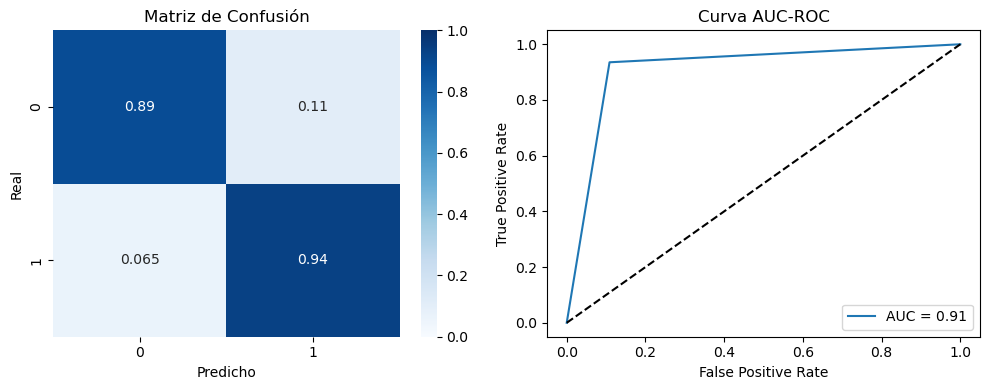

              precision    recall  f1-score   support

           0       0.96      0.89      0.92       285
           1       0.84      0.94      0.88       170

    accuracy                           0.91       455
   macro avg       0.90      0.91      0.90       455
weighted avg       0.91      0.91      0.91       455



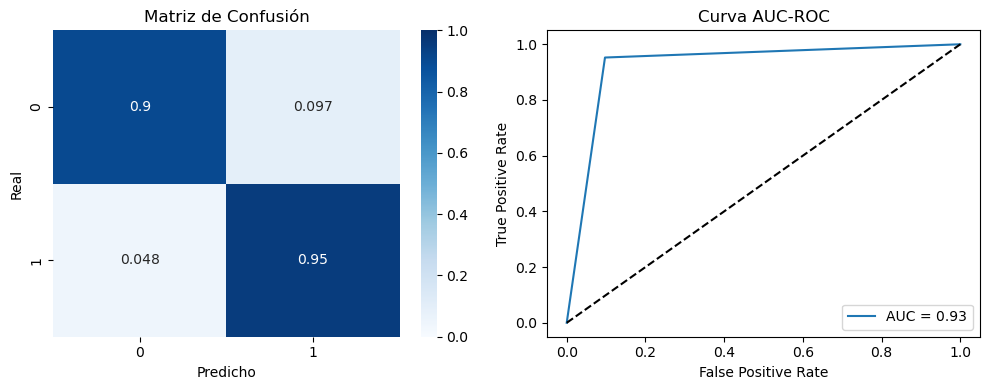

              precision    recall  f1-score   support

           0       0.97      0.90      0.94        72
           1       0.85      0.95      0.90        42

    accuracy                           0.92       114
   macro avg       0.91      0.93      0.92       114
weighted avg       0.93      0.92      0.92       114



In [157]:
dt_best_params = trials_df1[trials_df1['model'] == 'dt']['params'].iloc[0]
dt_classifier = DecisionTreeClassifier(**dt_best_params)
dt_classifier.fit(df_train, y_train)
y_train_pred = dt_classifier.predict(X = df_train)
y_test_pred = dt_classifier.predict(X = df_test)
y_train_proba = dt_classifier.predict_proba(df_train)[:, 1]
y_test_proba = dt_classifier.predict_proba(df_test)[:, 1]
resultados(y_train, y_train_pred, y_train_proba)
resultados(y_test, y_test_pred, y_test_proba)

In [158]:
lgbm_best_params = trials_df1[trials_df1['model'] == 'lgbm']['params'].iloc[0]
lgbm_best_params['verbosity'] = -1

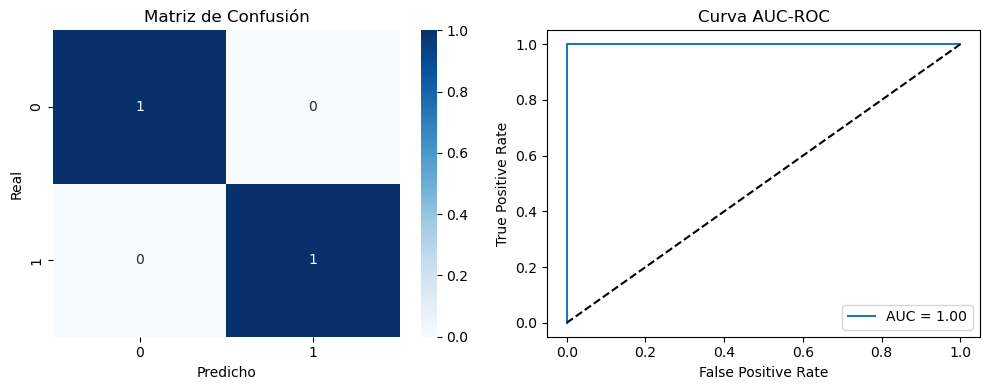

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       285
           1       1.00      1.00      1.00       170

    accuracy                           1.00       455
   macro avg       1.00      1.00      1.00       455
weighted avg       1.00      1.00      1.00       455



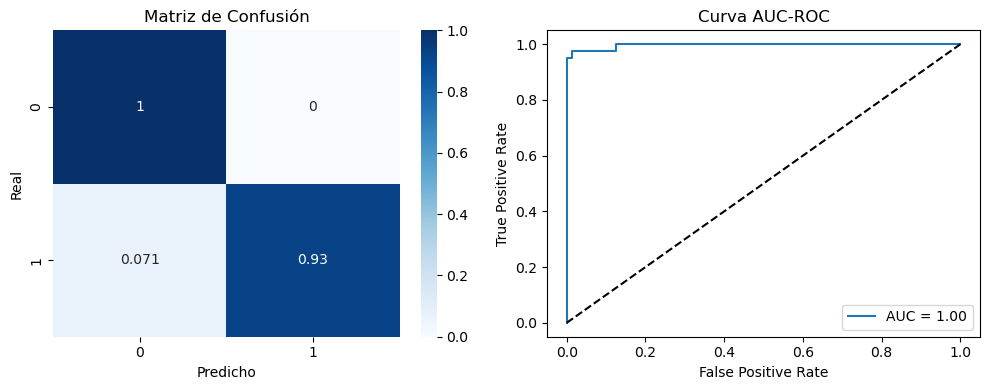

              precision    recall  f1-score   support

           0       0.96      1.00      0.98        72
           1       1.00      0.93      0.96        42

    accuracy                           0.97       114
   macro avg       0.98      0.96      0.97       114
weighted avg       0.97      0.97      0.97       114



In [159]:
lgbm_classifier = lgb.LGBMClassifier(**lgbm_best_params)
lgbm_classifier.fit(df_train, y_train)
y_train_pred = lgbm_classifier.predict(X = df_train)
y_test_pred = lgbm_classifier.predict(X = df_test)
y_train_proba = lgbm_classifier.predict_proba(df_train)[:, 1]
y_test_proba = lgbm_classifier.predict_proba(df_test)[:, 1]
resultados(y_train, y_train_pred, y_train_proba)
resultados(y_test, y_test_pred, y_test_proba)

##### De los modelos probados, el modelo logístico parece ser el que mejor generaliza, seguido por el de GradientBoosting, que también destaca tanto en generalización como en desempeño

### Es preferible predecir el 100% de los casos en los que las células son malignas. 
Para lograrlo, ajustamos la penalización de predecir incorrectamente la clase objetivo

#### Modifico la penalización de GradientBoostingClassifier

In [163]:
from sklearn.utils.class_weight import compute_sample_weight

In [164]:
# Calcular pesos para las muestras
sample_weights = compute_sample_weight(class_weight= {0: 1, 1: 100000}, y=y_train) # Penaliza 100000 veces más los errores en la clase 1

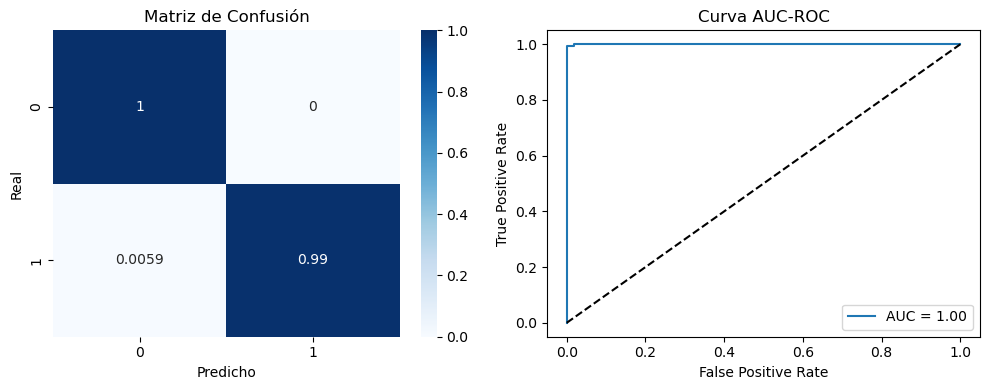

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       285
           1       1.00      0.99      1.00       170

    accuracy                           1.00       455
   macro avg       1.00      1.00      1.00       455
weighted avg       1.00      1.00      1.00       455



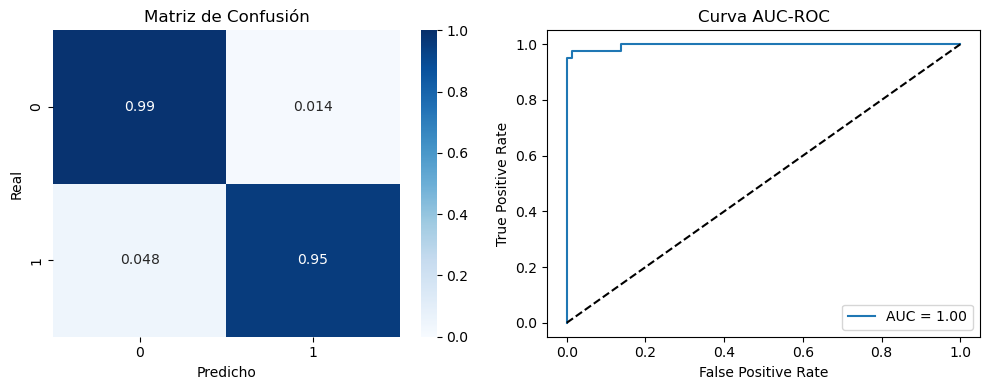

              precision    recall  f1-score   support

           0       0.97      0.99      0.98        72
           1       0.98      0.95      0.96        42

    accuracy                           0.97       114
   macro avg       0.97      0.97      0.97       114
weighted avg       0.97      0.97      0.97       114



In [165]:
custom_gbm_classifier = GradientBoostingClassifier(**gbm_best_params)
custom_gbm_classifier.fit(X_train_with_outliers, y_train, sample_weight=sample_weights)

y_train_pred = gbm_classifier.predict(X = X_train_with_outliers)
y_test_pred = gbm_classifier.predict(X = X_test_with_outliers)
y_train_proba = gbm_classifier.predict_proba(X_train_with_outliers)[:, 1]
y_test_proba = gbm_classifier.predict_proba(X_test_with_outliers)[:, 1]
resultados(y_train, y_train_pred, y_train_proba)
resultados(y_test, y_test_pred, y_test_proba)

##### Con el GradientBoostingClassifier, ni siquiera al penalizar 100000 veces la clase objetivo se logra detectar todas las células malignas

#### Modifico la penalización de LogisticRegression

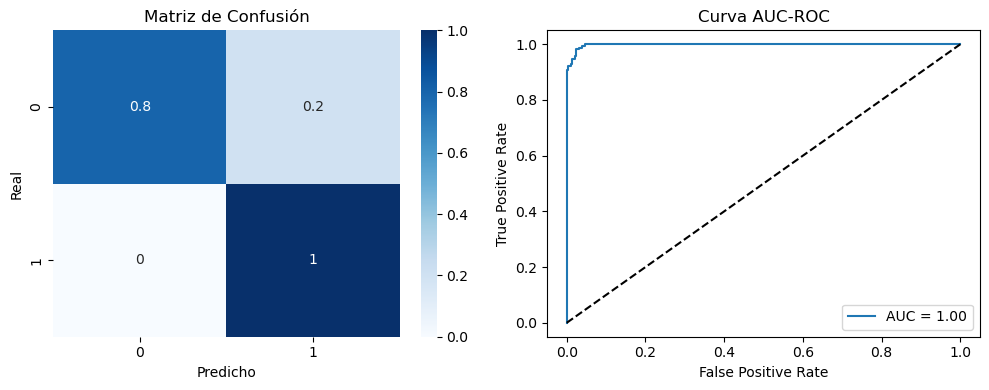

              precision    recall  f1-score   support

           0       1.00      0.80      0.89       285
           1       0.75      1.00      0.86       170

    accuracy                           0.87       455
   macro avg       0.87      0.90      0.87       455
weighted avg       0.91      0.87      0.88       455



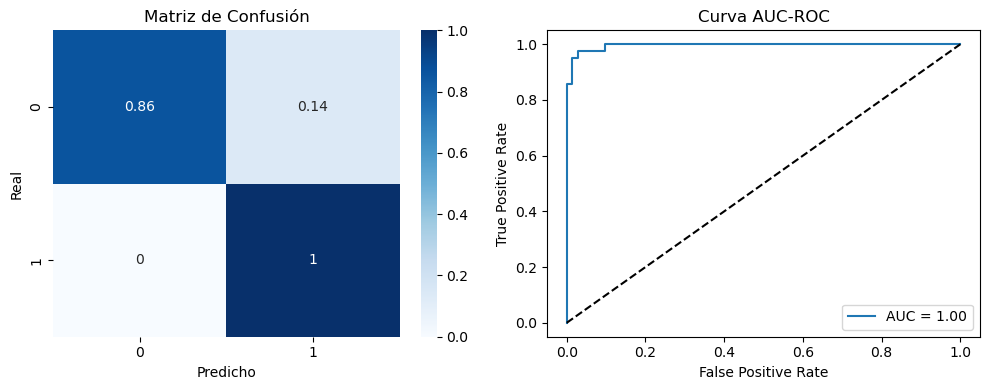

              precision    recall  f1-score   support

           0       1.00      0.86      0.93        72
           1       0.81      1.00      0.89        42

    accuracy                           0.91       114
   macro avg       0.90      0.93      0.91       114
weighted avg       0.93      0.91      0.91       114



In [168]:
logit_params_with_weight = logit_best_params.copy()
logit_params_with_weight['class_weight'] = {0: 1, 1: 500}  # Penaliza 500 veces más los errores en la clase 1

logit_classifier_with_weight = LogisticRegression(**logit_params_with_weight)
logit_classifier_with_weight.fit(df_train, y_train)
y_train_pred = logit_classifier_with_weight.predict(X = df_train)
y_train_proba = logit_classifier_with_weight.predict_proba(df_train)[:, 1]
resultados(y_train, y_train_pred, y_train_proba)

y_test_pred = logit_classifier_with_weight.predict(X = df_test) 
y_test_proba = logit_classifier_with_weight.predict_proba(df_test)[:,1]
resultados(y_test, y_test_pred, y_test_proba)

##### Si penalizamos las predicciones erróneas de la clase objetivo 500 veces más que las de la clase 0, este enfoque permite detectar el 100% de los pacientes con cáncer en la muestra de datos. Sin embargo, esta estrategia también incrementa las falsas alarmas, alcanzando un 20% de falsos positivos

## Seleccion de caracteristicas

### Verificamos si alguno de los conjuntos de mediciones (valores medios, las desviaciones estandar o las mediciones maximas) tiene mayor o menor importancia que el resto

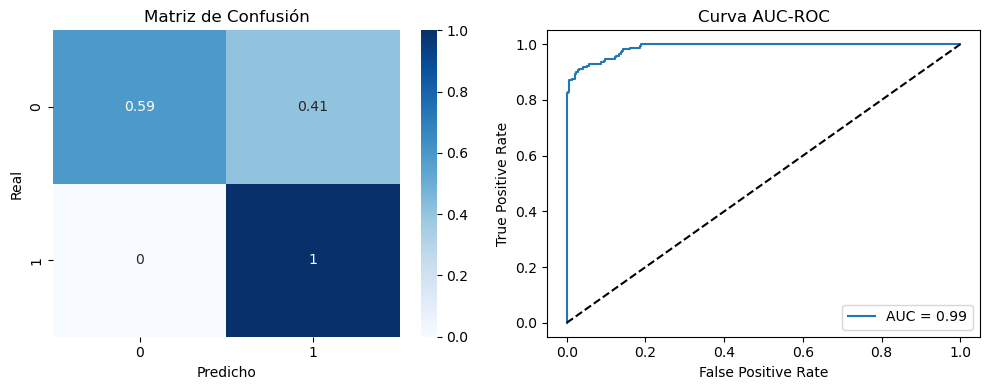

              precision    recall  f1-score   support

           0       1.00      0.59      0.74       285
           1       0.59      1.00      0.75       170

    accuracy                           0.75       455
   macro avg       0.80      0.80      0.75       455
weighted avg       0.85      0.75      0.74       455



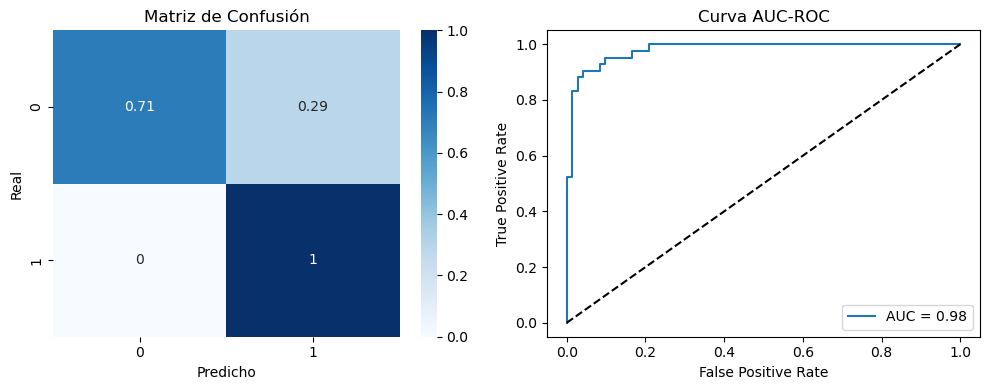

              precision    recall  f1-score   support

           0       1.00      0.71      0.83        72
           1       0.67      1.00      0.80        42

    accuracy                           0.82       114
   macro avg       0.83      0.85      0.81       114
weighted avg       0.88      0.82      0.82       114



In [172]:
logit_classifier = LogisticRegression(**logit_params_with_weight)
logit_classifier.fit(df_train_mean, y_train)
y_train_pred = logit_classifier.predict(X = df_train_mean)
y_test_pred = logit_classifier.predict(X = df_test_mean)
y_train_proba = logit_classifier.predict_proba(df_train_mean)[:, 1]
y_test_proba = logit_classifier.predict_proba(df_test_mean)[:, 1]

resultados(y_train, y_train_pred, y_train_proba)
resultados(y_test, y_test_pred, y_test_proba)

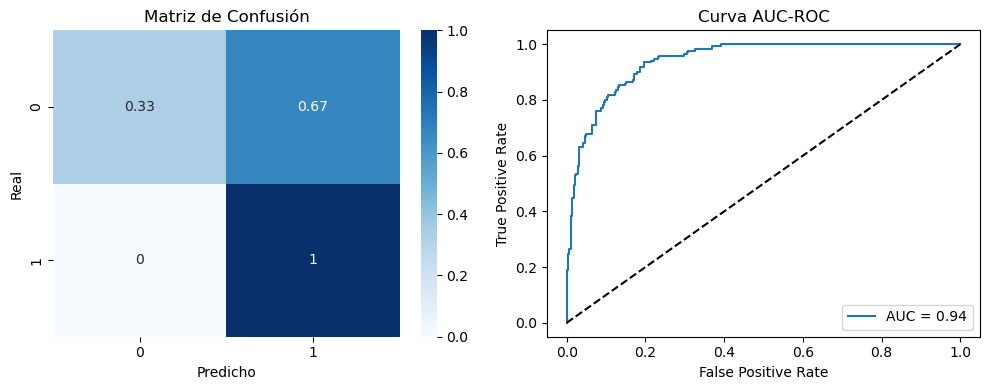

              precision    recall  f1-score   support

           0       1.00      0.33      0.50       285
           1       0.47      1.00      0.64       170

    accuracy                           0.58       455
   macro avg       0.74      0.66      0.57       455
weighted avg       0.80      0.58      0.55       455



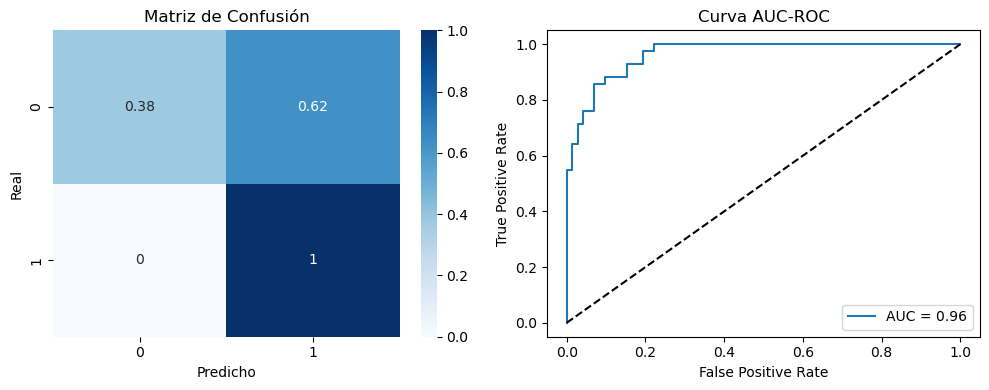

              precision    recall  f1-score   support

           0       1.00      0.38      0.55        72
           1       0.48      1.00      0.65        42

    accuracy                           0.61       114
   macro avg       0.74      0.69      0.60       114
weighted avg       0.81      0.61      0.58       114



In [173]:
logit_classifier = LogisticRegression(**logit_params_with_weight)
logit_classifier.fit(df_train_error, y_train)
y_train_pred = logit_classifier.predict(X = df_train_error)
y_test_pred = logit_classifier.predict(X = df_test_error)
y_train_proba = logit_classifier.predict_proba(df_train_error)[:, 1]
y_test_proba = logit_classifier.predict_proba(df_test_error)[:, 1]

resultados(y_train, y_train_pred, y_train_proba)
resultados(y_test, y_test_pred, y_test_proba)

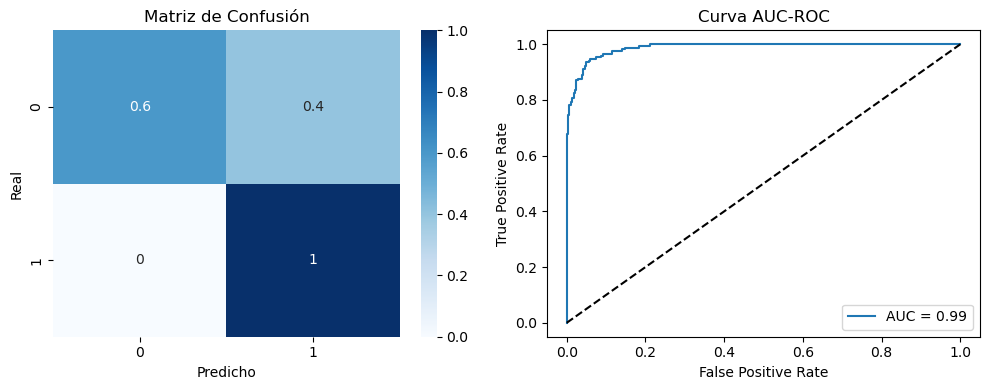

              precision    recall  f1-score   support

           0       1.00      0.60      0.75       285
           1       0.60      1.00      0.75       170

    accuracy                           0.75       455
   macro avg       0.80      0.80      0.75       455
weighted avg       0.85      0.75      0.75       455



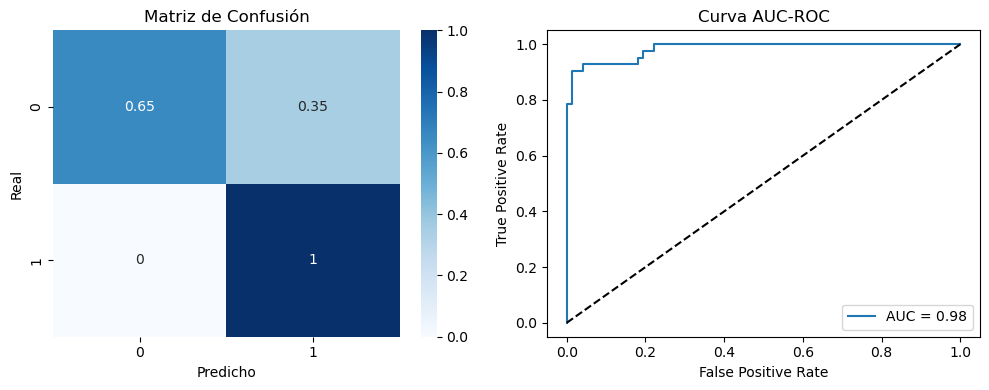

              precision    recall  f1-score   support

           0       1.00      0.65      0.79        72
           1       0.63      1.00      0.77        42

    accuracy                           0.78       114
   macro avg       0.81      0.83      0.78       114
weighted avg       0.86      0.78      0.78       114



In [174]:
logit_classifier_params_with_weight = LogisticRegression(**logit_params_with_weight)
logit_classifier_params_with_weight.fit(df_train_worst, y_train)
y_train_pred = logit_classifier_params_with_weight.predict(X = df_train_worst)
y_test_pred = logit_classifier_params_with_weight.predict(X = df_test_worst)
y_train_proba = logit_classifier_params_with_weight.predict_proba(df_train_worst)[:, 1]
y_test_proba = logit_classifier_params_with_weight.predict_proba(df_test_worst)[:, 1]

resultados(y_train, y_train_pred, y_train_proba)
resultados(y_test, y_test_pred, y_test_proba)

##### Las mediciones "worst" son las que menor cantidad de falsas alarmas presenta, seguido por "mean" y luego "se" . Sin embargo, el desempeño de entrenar con los subconjuntos es mucho menor que el de entrenar el modelo con todas las caracteristicas

### Selección de caracteristicas más importantes

Antes de aplicar un metodo como por ejemplo RFW, para seleccionar las caracteristicas más importantes y poder compararlas entre ellas buscaremos los mejores parametros para un modelo de regresion logistica con **regulación lasso**
Además, debemos tener en cuenta que cuando penalizas de manera diferente a las clases los coeficientes del modelo dejan de ser directamente comparables

In [178]:
def objective_logit(trial, X_train, y_train, metric = chosen_metric):
    # Definir los parámetros del modelo en un diccionario
    param = {
        'penalty': trial.suggest_categorical('logit_penalty', ['l1']),
        'C': trial.suggest_float('logit_c', 1e-5, 1e2, log=True),
        'solver': trial.suggest_categorical('logit_solver', ['liblinear', 'saga']),
        'max_iter': trial.suggest_int('logit_max_iter', 2000, 5000)
    }
    
    # Crear el modelo utilizando **param
    model = LogisticRegression(**param)
    model.fit(X_train, y_train)
    score = cross_val_score(model, X_train, y_train, cv=5, scoring=metric).mean()
    
    return score

#### Para poder comparar los coeficientes de las caracteristicas debemos escalar (no se transforma ni trata los outliers para tener una mejor interpretabilidad).

In [180]:
scaler = MinMaxScalerWithOutput()
X_train_scale_1 = scaler.fit_transform(X_train.copy())
X_test_scale_1 = scaler.transform(X_test.copy())

In [181]:
# study = optuna.create_study(direction='maximize')
# study.optimize(lambda trial: objective_logit(trial, X_train_scale_1, y_train, metric = 'accuracy'), n_trials = 100) 
# print('Number of finished trials:', len(study.trials))
# print('Best trial:', study.best_trial.params)
# log_params = study.best_trial.params
# log_params

In [182]:
log_params = {
    'penalty': 'l1',
    'C': 9.859665630651461,
    'solver': 'liblinear',
    'max_iter': 3926,
    'random_state': 42
}

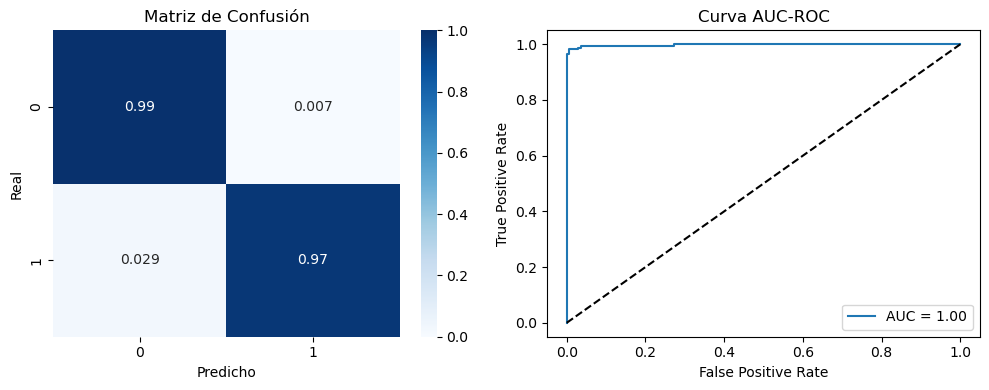

              precision    recall  f1-score   support

           0       0.98      0.99      0.99       285
           1       0.99      0.97      0.98       170

    accuracy                           0.98       455
   macro avg       0.99      0.98      0.98       455
weighted avg       0.98      0.98      0.98       455



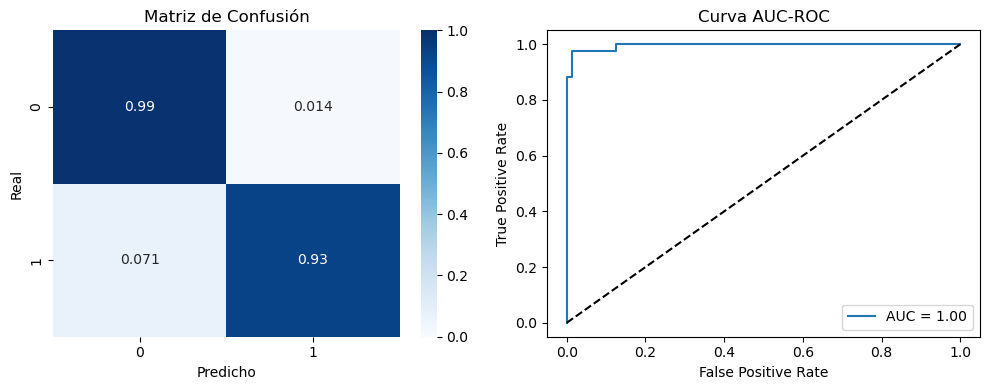

              precision    recall  f1-score   support

           0       0.96      0.99      0.97        72
           1       0.97      0.93      0.95        42

    accuracy                           0.96       114
   macro avg       0.97      0.96      0.96       114
weighted avg       0.97      0.96      0.96       114



In [183]:
just_scale_logit_classifier = LogisticRegression(**log_params)
just_scale_logit_classifier.fit(X_train_scale_1, y_train)

y_train_pred = just_scale_logit_classifier.predict(X = X_train_scale_1)
y_test_pred = just_scale_logit_classifier.predict(X = X_test_scale_1)
y_train_proba = just_scale_logit_classifier.predict_proba(X_train_scale_1)[:, 1]
y_test_proba = just_scale_logit_classifier.predict_proba(X_test_scale_1)[:, 1]

resultados(y_train, y_train_pred, y_train_proba)
resultados(y_test, y_test_pred, y_test_proba)

#### Creamos una clase que nos permitan modificar el umbral de decisión de LogisticRegression

In [185]:
from sklearn.base import ClassifierMixin
class LogisticRegressionWithThreshold(BaseEstimator, ClassifierMixin):
    def __init__(self, threshold=0.5, **kwargs):
        # Inicializa el modelo y el umbral
        self.model = LogisticRegression(**kwargs)
        self.threshold = threshold

    def fit(self, X, y):
        # Entrena el modelo
        self.model.fit(X, y)
        return self  # Necesario para pipelines, devuelve el objeto ajustado

    def predict(self, X):
        # Obtiene las probabilidades de la clase positiva
        y_pred_probs = self.model.predict_proba(X)[:, 1]
        # Aplica el umbral personalizado para predecir 0 o 1
        return (y_pred_probs >= self.threshold).astype(int)

    def predict_proba(self, X):
        # Retorna las probabilidades predichas como en el modelo original
        return self.model.predict_proba(X)

    def get_coefficients(self):
        # Verifica si el modelo ha sido entrenado y devuelve los coeficientes
        if hasattr(self.model, 'coef_'):
            return self.model.coef_
        else:
            raise ValueError("El modelo no ha sido entrenado aún.")
    
    def get_intercept(self):
        # Verifica si el modelo ha sido entrenado y devuelve el intercepto
        if hasattr(self.model, 'intercept_'):
            return self.model.intercept_
        else:
            raise ValueError("El modelo no ha sido entrenado aún.")
            
    def __getstate__(self):
        state = self.__dict__.copy()
        return state
    
    def __setstate__(self, state):
        self.__dict__.update(state)

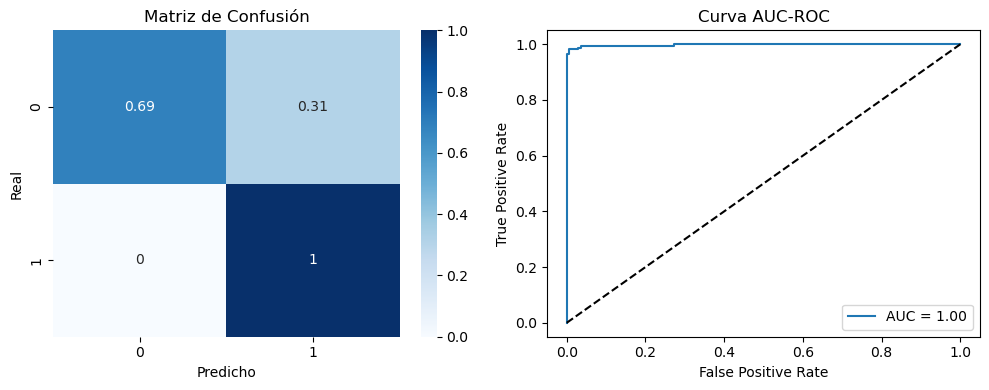

              precision    recall  f1-score   support

           0       1.00      0.69      0.82       285
           1       0.66      1.00      0.79       170

    accuracy                           0.81       455
   macro avg       0.83      0.85      0.81       455
weighted avg       0.87      0.81      0.81       455



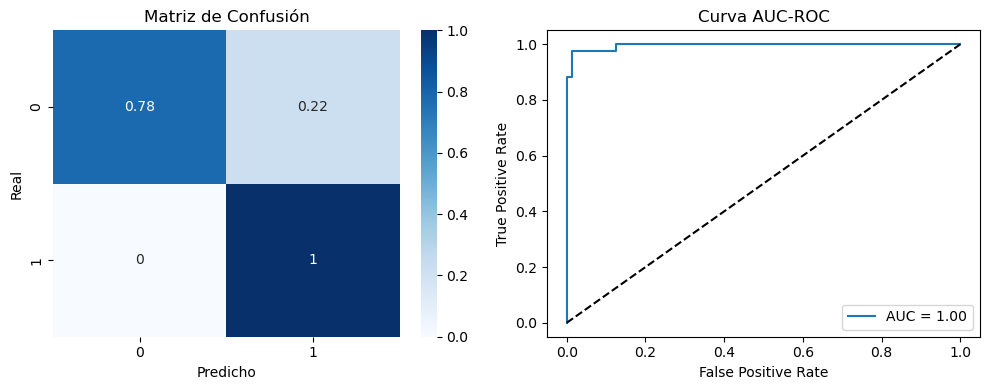

              precision    recall  f1-score   support

           0       1.00      0.78      0.88        72
           1       0.72      1.00      0.84        42

    accuracy                           0.86       114
   macro avg       0.86      0.89      0.86       114
weighted avg       0.90      0.86      0.86       114



In [186]:
custom_logit_classifier = LogisticRegressionWithThreshold(threshold=0.01, **log_params)
custom_logit_classifier.fit(X_train_scale_1, y_train)

y_train_pred = custom_logit_classifier.predict(X = X_train_scale_1)
y_test_pred = custom_logit_classifier.predict(X = X_test_scale_1)
y_train_proba = custom_logit_classifier.predict_proba(X_train_scale_1)[:, 1]
y_test_proba = custom_logit_classifier.predict_proba(X_test_scale_1)[:, 1]

resultados(y_train, y_train_pred, y_train_proba)
resultados(y_test, y_test_pred, y_test_proba)

##### Nótese que solamente escalando los datos (sin realizar la transformación y el tratamiento de outliers) podemos poner un umbral de 1% en lugar de 0.1% para detectar el total de los casos positivos, además los falsos positivos son del 30%.

#### Importancia de las caracteristicas **para el modelo**

In [189]:
# Obtener los coeficientes y convertirlos a 1D si es necesario
coef = custom_logit_classifier.get_coefficients()
coef_1d = coef.ravel()  # Convierte a 1D

# Asegúrate de que `features` y `coef_1d` tengan la misma longitud
features = X_train_scale_1.columns
if len(features) != len(coef_1d):
    raise ValueError("El número de características no coincide con el número de coeficientes.")

# Crear un DataFrame con los coeficientes y el exponente de los coeficientes
coef_df = pd.DataFrame({
    'Feature': features, 
    'Coefficient': coef_1d,
    'Odds Ratio (exp(Coefficient))': np.exp(coef_1d)  # Calcula el exponente del coeficiente
})

# Ordenar por el valor absoluto de los coeficientes
coef_df = coef_df.reindex(coef_df['Coefficient'].abs().sort_values(ascending=False).index)

# Mostrar el DataFrame resultante
coef_df

,Feature,Coefficient,Odds Ratio (exp(Coefficient))
10,radius error,27.797696,1.181371e+12
21,worst texture,13.472297,7.094864e+05
23,worst area,12.914082,4.059892e+05
7,mean concave points,12.809281,3.655948e+05
20,worst radius,8.834585,6.867707e+03
15,compactness error,-8.799109,1.508674e-04
26,worst concavity,8.189527,3.603016e+03
11,texture error,-6.589794,1.374323e-03
28,worst symmetry,5.258606,1.922134e+02
14,smoothness error,4.917181,1.366169e+02


- **Coeficientes positivos**: Indican que a medida que el valor de la característica aumenta, la probabilidad de que la observación pertenezca a la clase positiva (por ejemplo, "maligno") aumenta.
- **Coeficientes negativos**: Indican que a medida que el valor de la característica aumenta, la probabilidad de que la observación pertenezca a la clase negativa (por ejemplo, "benigno") aumenta.

Cuanto mayor en valor absoluto sea un coeficiente mayor el impacto en la predicción. Un valor más pequeño (cercano a 0) indica que esa característica tiene menos influencia en la predicción.

## Interpretación del Ratio de Odds

Supongamos dos observaciones, A y B, que son idénticas en todos sus valores excepto en una característica. Los valores de A son \([i_1, i_2, ..., i_k, ..., i_n]\) y los de B son \([i_1, i_2, ..., i_k + 1, ..., i_n]\), es decir, la característica \(i_k\) de B es una unidad mayor que la de A. El ratio de odds nos permite comparar las **chances** relativas de que cada observación pertenezca al grupo de interés, dada esa diferencia en la característica.

El **ratio de odds** se calcula como la razón de las odds de que una observación pertenezca al grupo de interés para A y B. En otras palabras, nos indica cómo cambian las **chances** de pertenecer al grupo de interés cuando una característica varía en una unidad entre las dos observaciones.

- Si el **ratio de odds es mayor que 1**, significa que, al aumentar una unidad en la característica de A a B, las **chances** de que B pertenezca al grupo de interés **aumentan** en relación con las **chances** de A. Es decir, **las chances de que B sea parte del grupo de interés son mayores que las de A** después de aumentar una unidad en esa característica.

- Si el **ratio de odds es menor que 1**, esto indica que, al aumentar una unidad en la característica de A a B, las **chances** de que A pertenezca al grupo de interés **aumentan** en relación con las **chances** de B. En este caso, **A tiene mayores chances de pertenecer al grupo de interés que B** después de ese incremento en la característica.

- Si el **ratio de odds es igual a 1**, las **chances** de que A y B pertenezcan al grupo de interés son **idénticas**, a pesar de la diferencia de una unidad en la característica.

Este concepto es útil para entender cómo el cambio de una característica específica (como un aumento de una unidad) afecta las **chances** de que una observación pertenezca al grupo de interés, manteniendo constantes las demás características.


#### Seleccioanar las caracteristicas a mantener

In [193]:
selected_features = coef_df['Feature'][coef_df['Coefficient'] != 0]
len(selected_features)

15

In [194]:
def get_features_to_drop(X, selected_features):
    # Agregar comillas a los valores de selected_features
    selected_features_with_quotes = [f"'{col}'" for col in selected_features]
    
    # Obtener las columnas a eliminar (aquellas que no están en selected_features)
    features_to_drop = [col for col in X.columns if f"'{col}'" not in selected_features_with_quotes]
    
    return features_to_drop

In [195]:
features_to_drop = get_features_to_drop(X_train, selected_features)
len(features_to_drop)

15

In [196]:
preprocesor_pipeline_just_scale = Pipeline([
    ('drop_features', DropFeatures(features_to_drop = features_to_drop)),
    ('scaler', MinMaxScalerWithOutput())
])

In [197]:
X_train = preprocesor_pipeline_just_scale.fit_transform(X_pipe_train)
X_test = preprocesor_pipeline_just_scale.transform(X_pipe_test)

In [198]:
y_train = y_pipe_train.values.flatten()
y_test = y_pipe_test.values.flatten()

### Verifico que tenga los mismo resultados que cuando se entrena con todas las caracteristicas

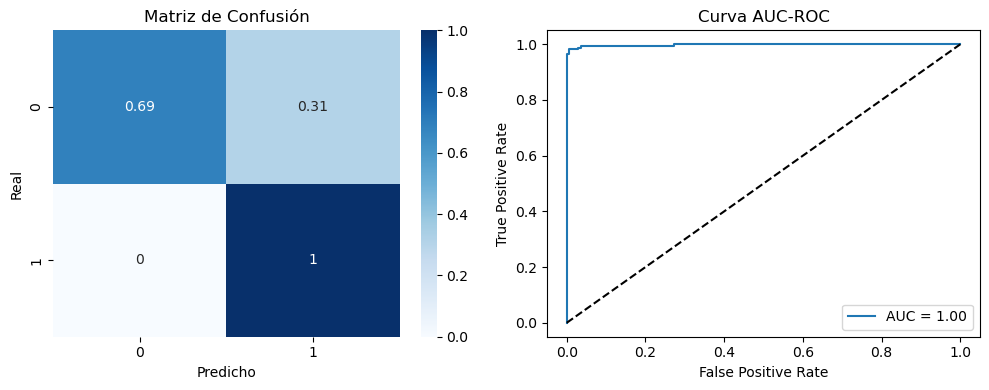

              precision    recall  f1-score   support

           0       1.00      0.69      0.81       285
           1       0.66      1.00      0.79       170

    accuracy                           0.80       455
   macro avg       0.83      0.84      0.80       455
weighted avg       0.87      0.80      0.81       455



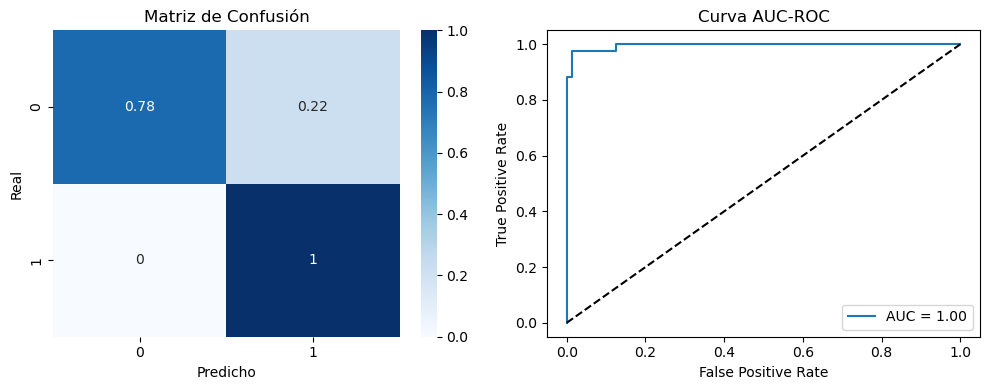

              precision    recall  f1-score   support

           0       1.00      0.78      0.88        72
           1       0.72      1.00      0.84        42

    accuracy                           0.86       114
   macro avg       0.86      0.89      0.86       114
weighted avg       0.90      0.86      0.86       114



In [200]:
custom_logit_classifier = LogisticRegressionWithThreshold(threshold=0.01, **log_params)
custom_logit_classifier.fit(X_train, y_train)

y_train_pred = custom_logit_classifier.predict(X = X_train)
y_test_pred = custom_logit_classifier.predict(X = X_test)
y_train_proba = custom_logit_classifier.predict_proba(X_train)[:, 1]
y_test_proba = custom_logit_classifier.predict_proba(X_test)[:, 1]

resultados(y_train, y_train_pred, y_train_proba)
resultados(y_test, y_test_pred, y_test_proba)

Los resultados obtenidos al usar `log_params` con las características removidas son equivalentes a los obtenidos sin eliminarlas. Sin embargo, los falsos negativos son ligeramente mayores en comparación con los resultados obtenidos utilizando los parámetros de `logit_params_with_weight`. Aunque la interpretabilidad se ve algo dificultada continuaremos con `logit_params_with_weight`.

#### Mejores características con logit y mejores parámetros

In [203]:
logit_classifier = LogisticRegression(**logit_best_params)
logit_classifier.fit(df_train, y_train)

LogisticRegression(C=39.3667854011617, max_iter=902, penalty='l1',
                   random_state=42, solver='liblinear')

In [204]:
# Obtener los coeficientes y los nombres de las características
coef = logit_classifier.coef_[0]
features = df_train.columns  # Asegúrate de que `X_train_scale_1` contenga el conjunto de datos con nombres de las características

# Crear un DataFrame con los coeficientes y el exponente de los coeficientes
coef_df = pd.DataFrame({
    'Feature': features, 
    'Coefficient': coef,
    'Odds Ratio (exp(Coefficient))': np.exp(coef)  # Calcula el exponente del coeficiente
})

# Ordenar por el valor absoluto de los coeficientes
coef_df = coef_df.reindex(coef_df['Coefficient'].abs().sort_values(ascending=False).index)

In [205]:
selected_features = coef_df['Feature'][coef_df['Coefficient'] != 0]
len(selected_features)

22

In [206]:
features_to_drop = get_features_to_drop(df_train, selected_features)
len(features_to_drop)

8

### Evaluo diferentes desempeños con distintos pipelines

In [208]:
X_train_raw, X_test_raw, y_train_raw, y_test_raw = train_test_split(X,y,test_size = 0.2,random_state = 42, stratify=y)

In [209]:
y_train_raw = y_train_raw.values.flatten()
y_test_raw = y_test_raw.values.flatten()

#### Desempeño si solo escalo

In [211]:
preprocesor_pipeline_just_scale = Pipeline([
    ('drop_features', DropFeatures(features_to_drop = features_to_drop)),
    ('scaler', MinMaxScalerWithOutput())
])

In [212]:
X_train = preprocesor_pipeline_just_scale.fit_transform(X_train_raw.copy())
X_test = preprocesor_pipeline_just_scale.transform(X_test_raw.copy())

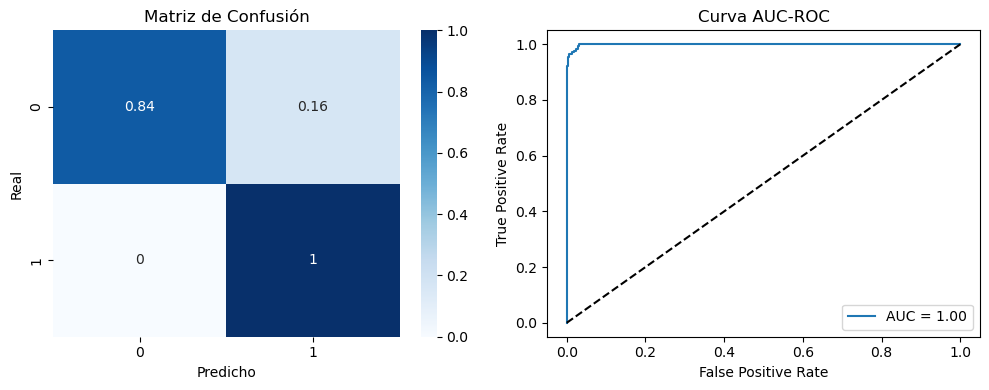

              precision    recall  f1-score   support

           0       1.00      0.84      0.91       285
           1       0.78      1.00      0.88       170

    accuracy                           0.90       455
   macro avg       0.89      0.92      0.89       455
weighted avg       0.92      0.90      0.90       455



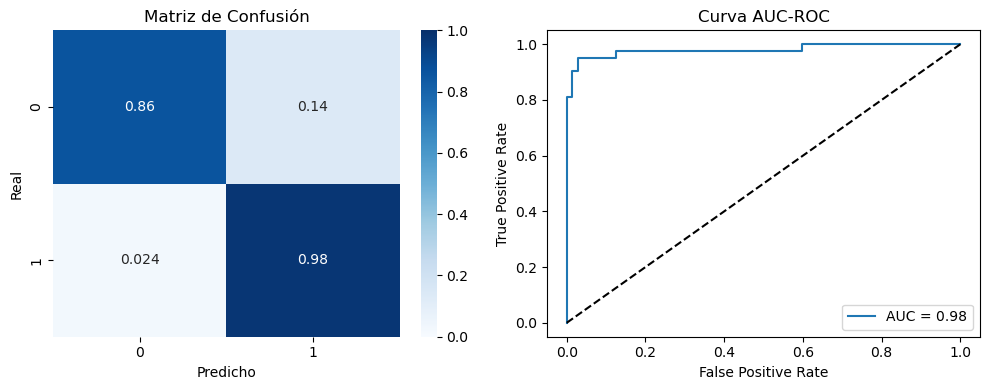

              precision    recall  f1-score   support

           0       0.98      0.86      0.92        72
           1       0.80      0.98      0.88        42

    accuracy                           0.90       114
   macro avg       0.89      0.92      0.90       114
weighted avg       0.92      0.90      0.90       114



In [213]:
custom_logit_classifier_just_scale = LogisticRegression(**logit_params_with_weight)
custom_logit_classifier_just_scale.fit(X_train, y_train)

y_train_pred = custom_logit_classifier_just_scale.predict(X = X_train)
y_test_pred = custom_logit_classifier_just_scale.predict(X = X_test)
y_train_proba = custom_logit_classifier_just_scale.predict_proba(X_train)[:, 1]
y_test_proba = custom_logit_classifier_just_scale.predict_proba(X_test)[:, 1]

resultados(y_train, y_train_pred, y_train_proba)
resultados(y_test, y_test_pred, y_test_proba)

#### Desempeño aplicando todas las transformaciones

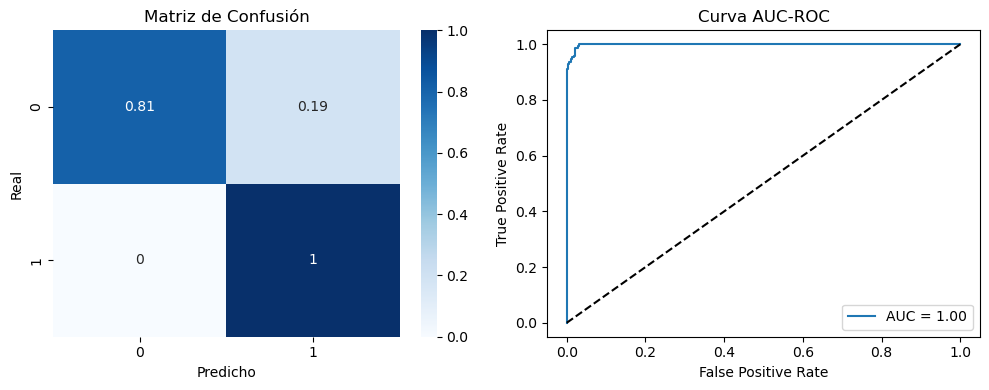

              precision    recall  f1-score   support

           0       1.00      0.81      0.90       285
           1       0.76      1.00      0.86       170

    accuracy                           0.88       455
   macro avg       0.88      0.91      0.88       455
weighted avg       0.91      0.88      0.88       455



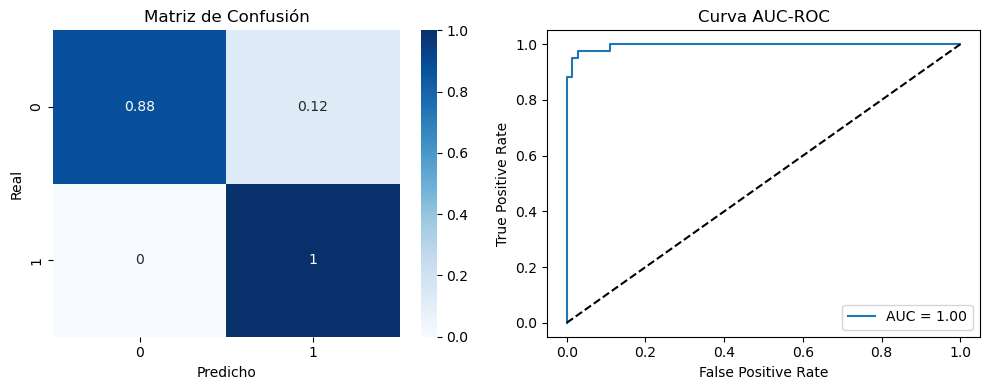

              precision    recall  f1-score   support

           0       1.00      0.88      0.93        72
           1       0.82      1.00      0.90        42

    accuracy                           0.92       114
   macro avg       0.91      0.94      0.92       114
weighted avg       0.93      0.92      0.92       114



In [215]:
preprocesor_pipeline2 = Pipeline([
    ('drop_features', DropFeatures(features_to_drop = features_to_drop)),
    ('yeo_johnson', YeoJohnsonTransformer()), 
    ('winsorizer', Winsorizer(capping_method='iqr', tail='both', fold=1.5)), 
    ('scaler', MinMaxScalerWithOutput())
])

X_train_trans = preprocesor_pipeline2.fit_transform(X_train_raw.copy())
X_test_trans = preprocesor_pipeline2.transform(X_test_raw.copy())

custom_logit_classifier_2 = LogisticRegression(**logit_params_with_weight)
custom_logit_classifier_2.fit(X_train_trans, y_train)

y_train_pred = custom_logit_classifier_2.predict(X = X_train_trans)
y_test_pred = custom_logit_classifier_2.predict(X = X_test_trans)
y_train_proba = custom_logit_classifier_2.predict_proba(X_train_trans)[:, 1]
y_test_proba = custom_logit_classifier_2.predict_proba(X_test_trans)[:, 1]

resultados(y_train, y_train_pred, y_train_proba)
resultados(y_test, y_test_pred, y_test_proba)

##### Se selecciona como modelo final a LogisticRegression con el preprocesamiento de datos del pipeline preprocesor_pipeline2 y con parametros logit_params_with_weight

In [217]:
modelo_final = LogisticRegression(**logit_params_with_weight)

## Modelo Final

In [219]:
X_train_raw, X_test_raw, y_train_raw, y_test_raw = train_test_split(X,y,test_size = 0.2,random_state = 42, stratify=y)

In [220]:
y_train_raw = y_train_raw.values.flatten()

In [221]:
breast_cancer_model = Pipeline([
    ('drop_features', DropFeatures(features_to_drop = features_to_drop)),
    ('yeo_johnson', YeoJohnsonTransformer()), 
    ('winsorizer', Winsorizer(capping_method='iqr', tail='both', fold=1.5)), 
    ('scaler', MinMaxScalerWithOutput()),
    ('logreg', modelo_final)
])

breast_cancer_model.fit(X_train_raw.copy(), y_train_raw.copy())

Pipeline(steps=[('drop_features',
                 DropFeatures(features_to_drop=['concavity error', 'mean area',
                                                'mean concavity',
                                                'mean perimeter', 'mean radius',
                                                'worst compactness',
                                                'worst perimeter',
                                                'worst radius'])),
                ('yeo_johnson', YeoJohnsonTransformer()),
                ('winsorizer',
                 Winsorizer(capping_method='iqr', fold=1.5, tail='both')),
                ('scaler', MinMaxScalerWithOutput()),
                ('logreg',
                 LogisticRegression(C=39.3667854011617,
                                    class_weight={0: 1, 1: 500}, max_iter=902,
                                    penalty='l1', random_state=42,
                                    solver='liblinear'))])

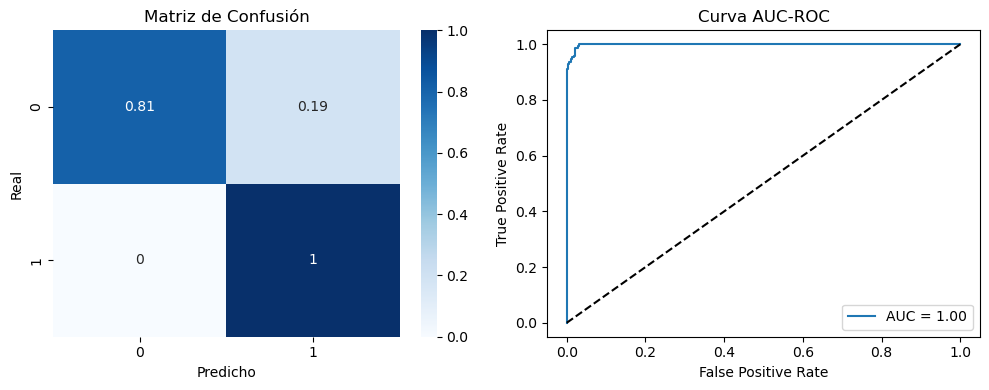

              precision    recall  f1-score   support

           0       1.00      0.81      0.90       285
           1       0.76      1.00      0.86       170

    accuracy                           0.88       455
   macro avg       0.88      0.91      0.88       455
weighted avg       0.91      0.88      0.88       455



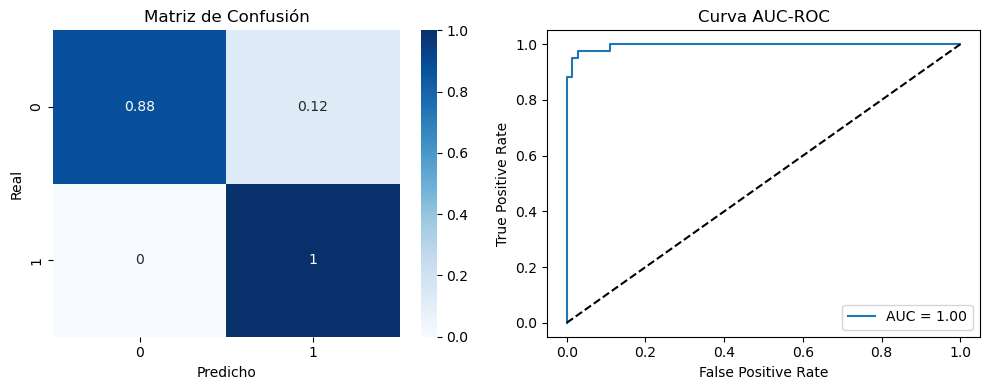

              precision    recall  f1-score   support

           0       1.00      0.88      0.93        72
           1       0.82      1.00      0.90        42

    accuracy                           0.92       114
   macro avg       0.91      0.94      0.92       114
weighted avg       0.93      0.92      0.92       114



In [222]:
### Verifico que el modelo final tenga el mismo desempeño que el seleccionado
y_train_pred = breast_cancer_model.predict(X = X_train_raw)
y_test_pred = breast_cancer_model.predict(X_test_raw)
y_train_proba = breast_cancer_model.predict_proba(X_train_raw)[:, 1]
y_test_proba = breast_cancer_model.predict_proba(X_test_raw)[:, 1]
resultados(y_train_raw, y_train_pred, y_train_proba)
resultados(y_test_raw, y_test_pred, y_test_proba)

### Desempeño del modelo final

In [224]:
def resultados_clasificacion_cv(model, X, y, cv=5, include_auc_roc=False):
    """
    Esta función evalúa el rendimiento de un modelo de clasificación bivariada utilizando
    varias métricas: accuracy, precision, recall, f1-score, FPR y opcionalmente auc-roc, con 
    validación cruzada (CV). Devuelve un DataFrame con los resultados de las métricas, 
    sus medias, desviaciones estándar y los intervalos de confianza al 95%.
    
    Parámetros:
    - model: el modelo de clasificación a evaluar.
    - X: array-like, características del modelo (conjunto de entrenamiento).
    - y: array-like, valores verdaderos de las etiquetas (valores reales).
    - cv: número de pliegues para la validación cruzada (default es 5).
    - include_auc_roc: booleano, si se debe incluir la métrica AUC-ROC (default es False).
    
    Retorna:
    - df_resultados: DataFrame con las métricas y sus estadísticas.
    """
    
    # Asegurarse de que y sea un pandas Series con el mismo índice que X
    if isinstance(y, np.ndarray):
        y = pd.Series(y, index=X.index)  # Convertir y a pandas Series si es un array
    
    # Inicializar el objeto KFold para cross-validation
    kf = KFold(n_splits=cv, shuffle=True, random_state=42)
    
    # Listas para almacenar los resultados de cada pliegue
    accuracy_scores = []
    precision_scores = []
    recall_scores = []
    f1_scores = []
    fpr_scores = []  # Nueva lista para almacenar la tasa de falsas alarmas (FPR)
    auc_roc_scores = []  # Solo se agregará si include_auc_roc es True
    
    for train_idx, test_idx in kf.split(X):
        # Usar .iloc para indexar correctamente las filas
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
        
        # Entrenar el modelo
        model.fit(X_train, y_train)
        
        # Predecir con el modelo
        y_pred = model.predict(X_test)
        
        # Calcular las métricas
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        
        # Calcular el False Positive Rate (FPR)
        tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
        fpr = fp / (fp + tn) if (fp + tn) != 0 else 0  # Evitar división por cero
        
        # AUC-ROC solo si se solicita
        if include_auc_roc:
            auc_roc = roc_auc_score(y_test, model.predict_proba(X_test)[:, 1])  # Suponiendo clasificación binaria
            auc_roc_scores.append(auc_roc)
        
        # Guardar las métricas de este pliegue
        accuracy_scores.append(accuracy)
        precision_scores.append(precision)
        recall_scores.append(recall)
        f1_scores.append(f1)
        fpr_scores.append(fpr)  # Agregar el FPR
        
    # Calcular las medias y desviaciones estándar
    accuracy_mean = np.mean(accuracy_scores)
    accuracy_std = np.std(accuracy_scores)
    precision_mean = np.mean(precision_scores)
    precision_std = np.std(precision_scores)
    recall_mean = np.mean(recall_scores)
    recall_std = np.std(recall_scores)
    f1_mean = np.mean(f1_scores)
    f1_std = np.std(f1_scores)
    fpr_mean = np.mean(fpr_scores)
    fpr_std = np.std(fpr_scores)
    
    # Calcular intervalos de confianza al 95% (usando una distribución t-student)
    ci_accuracy = stats.t.interval(0.95, len(accuracy_scores)-1, loc=accuracy_mean, scale=accuracy_std/np.sqrt(len(accuracy_scores)))
    ci_precision = stats.t.interval(0.95, len(precision_scores)-1, loc=precision_mean, scale=precision_std/np.sqrt(len(precision_scores)))
    ci_recall = stats.t.interval(0.95, len(recall_scores)-1, loc=recall_mean, scale=recall_std/np.sqrt(len(recall_scores)))
    ci_f1 = stats.t.interval(0.95, len(f1_scores)-1, loc=f1_mean, scale=f1_std/np.sqrt(len(f1_scores)))
    ci_fpr = stats.t.interval(0.95, len(fpr_scores)-1, loc=fpr_mean, scale=fpr_std/np.sqrt(len(fpr_scores)))
    
    # AUC-ROC intervalo de confianza si está incluido
    ci_auc_roc = (None, None)
    if include_auc_roc and auc_roc_scores:
        auc_roc_mean = np.mean(auc_roc_scores)
        auc_roc_std = np.std(auc_roc_scores)
        ci_auc_roc = stats.t.interval(0.95, len(auc_roc_scores)-1, loc=auc_roc_mean, scale=auc_roc_std/np.sqrt(len(auc_roc_scores)))
    
    # Crear el DataFrame de resultados
    data = {
        "Metric": ["Accuracy", "Precision", "Recall", "F1-Score", "False Positive Rate (FPR)", "AUC-ROC" if include_auc_roc else ""],
        "Mean": [accuracy_mean, precision_mean, recall_mean, f1_mean, fpr_mean, auc_roc_mean if include_auc_roc else None],
        "Std": [accuracy_std, precision_std, recall_std, f1_std, fpr_std, auc_roc_std if include_auc_roc else None],
        "Confidence Interval Lower": [ci_accuracy[0], ci_precision[0], ci_recall[0], ci_f1[0], ci_fpr[0], ci_auc_roc[0] if include_auc_roc else None],
        "Confidence Interval Upper": [ci_accuracy[1], ci_precision[1], ci_recall[1], ci_f1[1], ci_fpr[1], ci_auc_roc[1] if include_auc_roc else None]
    }
    
    # Eliminar la columna AUC-ROC si no se incluyó
    if not include_auc_roc:
        del data["Metric"][-1]
        del data["Mean"][-1]
        del data["Std"][-1]
        del data["Confidence Interval Lower"][-1]
        del data["Confidence Interval Upper"][-1]
    
    df_resultados = pd.DataFrame(data)
    
    return df_resultados

In [225]:
df_resultados = resultados_clasificacion_cv(modelo_final, X_train, y_train, include_auc_roc = True)
df_resultados

,Metric,Mean,Std,Confidence Interval Lower,Confidence Interval Upper
0,Accuracy,0.894505,0.040881,0.843744,0.945267
1,Precision,0.788021,0.070590,0.700372,0.875671
2,Recall,0.989744,0.020513,0.964274,1.015214
3,F1-Score,0.875577,0.045499,0.819084,0.932071
4,False Positive Rate (FPR),0.160900,0.058891,0.087778,0.234022
5,AUC-ROC,0.990768,0.008871,0.979753,1.001783


**Recall (Recuperación o Sensibilidad)**: el valor de Recall se encuentra en el intervalo de confianza de [0.964274, 1.015214], con un valor medio de 0.989744. Esto indica que el modelo puede identificar correctamente las instancias positivas con un rendimiento que varía entre el 96.43% y el 100%. Estos valores se pueden mejorar aumentando la penalización de la clase 1 a detrimento de aumentar la cantidad de falsos positivos.

Precision (Precisión): el valor de Precision se encuentra entre [0.700372, 0.875671], lo que indica que cuando el modelo predice una clase positiva, la probabilidad de que la predicción sea correcta varía entre el 70.03% y el 87.56%. Este intervalo sugiere una precisión razonable, con margen de mejora en la exactitud de las predicciones positivas.

Falsos positivos: su valor se encuentra entra [0.087778, 0.234022] por lo que entre el 9% y 24% de las predicciones se clasificaran como celulas malignas erroneamente.

## Guardo el modelo final

In [228]:
import joblib

In [229]:
joblib.dump(breast_cancer_model, 'breast_cancer_pipeline.joblib')

['breast_cancer_pipeline.joblib']

### Cargo el modelo y verifico su desempeño

In [231]:
X_train_raw, X_test_raw, y_train_raw, y_test_raw = train_test_split(X,y,test_size = 0.2,random_state = 42, stratify=y)
y_train_raw = y_train_raw.values.flatten()

In [232]:
loaded_model = joblib.load('breast_cancer_pipeline.joblib')

In [452]:
loaded_model.fit(X_train_raw, y_train_raw) # No debería ser necesario entrenar el modelo

Pipeline(steps=[('drop_features',
                 DropFeatures(features_to_drop=['concavity error', 'mean area',
                                                'mean concavity',
                                                'mean perimeter', 'mean radius',
                                                'worst compactness',
                                                'worst perimeter',
                                                'worst radius'])),
                ('yeo_johnson', YeoJohnsonTransformer()),
                ('winsorizer',
                 Winsorizer(capping_method='iqr', fold=1.5, tail='both')),
                ('scaler', MinMaxScalerWithOutput()),
                ('logreg',
                 LogisticRegression(C=39.3667854011617,
                                    class_weight={0: 1, 1: 500}, max_iter=902,
                                    penalty='l1', random_state=42,
                                    solver='liblinear'))])

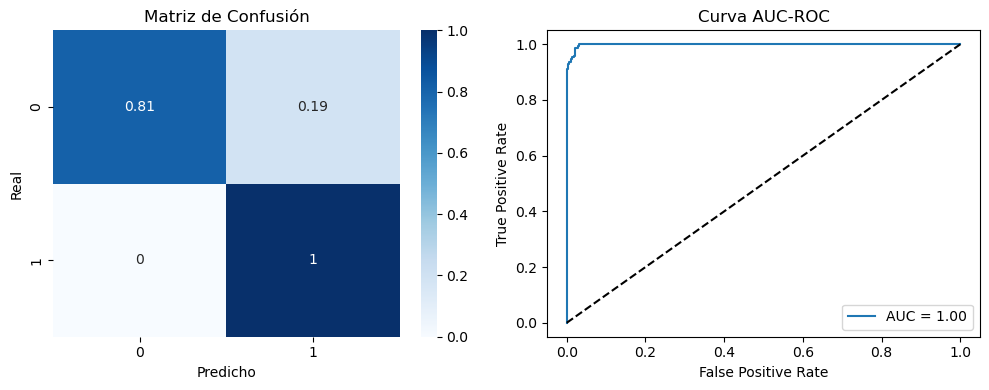

              precision    recall  f1-score   support

           0       1.00      0.81      0.90       285
           1       0.76      1.00      0.86       170

    accuracy                           0.88       455
   macro avg       0.88      0.91      0.88       455
weighted avg       0.91      0.88      0.88       455



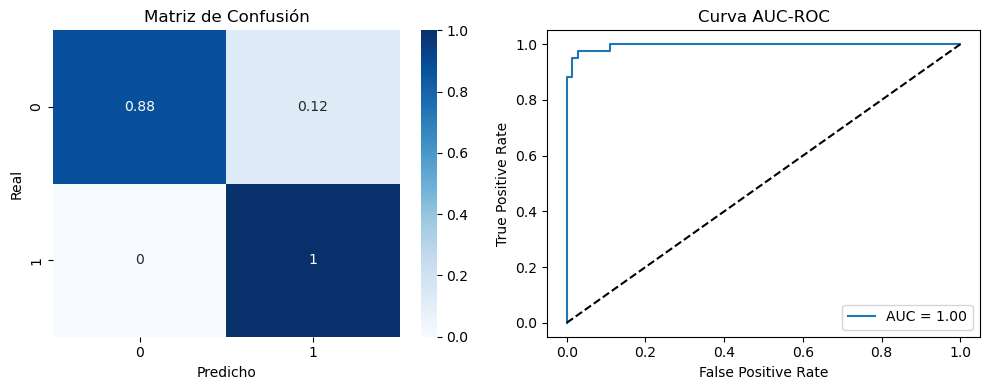

              precision    recall  f1-score   support

           0       1.00      0.88      0.93        72
           1       0.82      1.00      0.90        42

    accuracy                           0.92       114
   macro avg       0.91      0.94      0.92       114
weighted avg       0.93      0.92      0.92       114



In [450]:
# Hacer predicciones con el pipeline cargado
y_train_pred = loaded_model.predict(X_train_raw)
y_test_pred = loaded_model.predict(X_test_raw)

# Obtener probabilidades de predicción
y_train_proba = loaded_model.predict_proba(X_train_raw)[:, 1]
y_test_proba = loaded_model.predict_proba(X_test_raw)[:, 1]

# Evaluar los resultados
resultados(y_train_raw, y_train_pred, y_train_proba)
resultados(y_test_raw, y_test_pred, y_test_proba)